In [1]:
import numpy as np
import pandas as pd
import scipy as sp
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import font_manager
from math import sqrt
import sklearn
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.feature_selection import RFE, RFECV, SequentialFeatureSelector, SelectKBest, f_regression, mutual_info_regression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.preprocessing import StandardScaler, MultiLabelBinarizer
import lightgbm as lgb
import xgboost as xgb
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from hyperopt import fmin, tpe, hp, Trials
from bayes_opt import BayesianOptimization
import re, ast



import warnings
warnings.filterwarnings('ignore')

font_fname = 'C:/Windows/Fonts/malgun.ttf'
font_family = font_manager.FontProperties(fname=font_fname).get_name()

plt.rcParams["font.family"] = font_family
plt.rcParams["axes.unicode_minus"] = False


%matplotlib inline

### 데이터 로드 및 nan제거

In [24]:
df = pd.read_csv('plus_elementary.csv')

In [25]:
len(set(df['아파트명']))

127

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3296 entries, 0 to 3295
Data columns (total 50 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   아파트명           3296 non-null   object 
 1   법정동주소          3296 non-null   object 
 2   위도             3296 non-null   float64
 3   경도             3296 non-null   float64
 4   세대수            3296 non-null   int64  
 5   임대세대수          3070 non-null   float64
 6   최고층            3293 non-null   float64
 7   최저층            3293 non-null   float64
 8   최대공급면적         3296 non-null   float64
 9   최소공급면적         3296 non-null   float64
 10  총아파트동수         3293 non-null   float64
 11  용적률            2943 non-null   float64
 12  건폐율            2883 non-null   float64
 13  세대평균_주차대수      3270 non-null   float64
 14  공급면적           3296 non-null   float64
 15  전용면적           3296 non-null   float64
 16  전용율            3296 non-null   float64
 17  방수             3292 non-null   float64
 18  욕실수     

In [5]:
drop_col = ['아파트명','법정동주소','현관구조','위도','경도','임대세대수','지하철역','역사명']

In [6]:
filtered_df = df.dropna(subset=['용적률', '건폐율'])

In [7]:
filtered_df = df.dropna(subset=['용적률', '건폐율'])
dropped_indices = df.index.difference(filtered_df.index)
dropped_data = df.loc[dropped_indices]
filtered_df.drop(drop_col, axis=1, inplace=True)
filtered_df.dropna(inplace=True)
filtered_df['입주예정연도'] = filtered_df['입주예정연도'].astype(str)
filtered_df.reset_index(drop=True, inplace=True)

In [8]:
len(set(dropped_data['아파트명']))

70

In [9]:
# 노선명을 추출하여 리스트로 저장
filtered_df['노선명_리스트'] = filtered_df['노선명_리스트'].apply(ast.literal_eval)
all_rail = set(rail for rail_list in filtered_df['노선명_리스트'] for rail in rail_list)

# MultiLabelBinarizer를 사용하여 원핫인코딩 수행
mlb = MultiLabelBinarizer()
encoded_routes = mlb.fit_transform(filtered_df['노선명_리스트'])
encoded_routes_df = pd.DataFrame(encoded_routes, columns=mlb.classes_)

# 원핫인코딩 결과를 원래 데이터프레임과 병합
df_encoded = pd.concat([filtered_df, encoded_routes_df], axis=1)
df_encoded.drop('노선명_리스트', axis=1, inplace=True)
df_encoded.keys()

Index(['세대수', '최고층', '최저층', '최대공급면적', '최소공급면적', '총아파트동수', '용적률', '건폐율',
       '세대평균_주차대수', '공급면적', '전용면적', '전용율', '방수', '욕실수', '입주예정연도', '공급액(만원)',
       '대형건설사', '지하철역_거리', '1차병원', '2차병원', '3차병원', '공원', '대학', '광역', '기초',
       '소매', '음식', '교육', '장례식장', '보건의료', '유원지오락', '총인구수', '투기과열지구_after',
       '분양가상한제_after', '투기과열지구_before', '분양가상한제_before', '시군구내_통근통학',
       '타시군구_통근통학', '타시군구/시군구내', '평당_공급액', '타입', '1호선', '2호선', '3호선', '4호선',
       '5호선', '6호선', '7호선', '8호선', '9호선', '경강선', '경의중앙선', '경춘선', '김포골드라인',
       '분당선', '서해선', '수인선', '신림선', '신분당선', '에버라인', '우이신설선', '의정부선', '인천국제공항선',
       '인천지하철 1호선', '인천지하철 2호선'],
      dtype='object')

In [10]:
df_encoded['기초'] = df_encoded['광역'] +'_'+ df_encoded['기초']

In [11]:
df_encoded = pd.get_dummies(df_encoded, columns=['입주예정연도','광역','기초'])

In [12]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2838 entries, 0 to 2837
Columns: 137 entries, 세대수 to 기초_인천_중구
dtypes: bool(1), float64(20), int32(24), int64(17), uint8(75)
memory usage: 1.3 MB


In [13]:
df_encoded.to_csv('reg_data_real_final.csv', index=False)

In [14]:
df_encoded = pd.read_csv('reg_data_real_final.csv')

In [15]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2838 entries, 0 to 2837
Columns: 137 entries, 세대수 to 기초_인천_중구
dtypes: bool(1), float64(20), int64(116)
memory usage: 2.9 MB


In [16]:
one_hot_encoded_columns = df_encoded.columns[df_encoded.isin([0, 1]).all()]

In [17]:
y_val_col = ['공급액(만원)', '평당_공급액']

In [18]:
drop_x_col = ['전용면적', '시군구내_통근통학', '타시군구_통근통학', '투기과열지구_after',
       '분양가상한제_after', '투기과열지구_before', '분양가상한제_before']

In [19]:
df_y_drop = df_encoded.drop(y_val_col, axis=1)
df_y_drop2 = df_y_drop.drop(drop_x_col, axis=1)
con_list = df_y_drop.drop(one_hot_encoded_columns, axis=1).columns

In [23]:
list(df_encoded.columns)

['세대수',
 '최고층',
 '최저층',
 '최대공급면적',
 '최소공급면적',
 '총아파트동수',
 '용적률',
 '건폐율',
 '세대평균_주차대수',
 '공급면적',
 '전용면적',
 '전용율',
 '방수',
 '욕실수',
 '공급액(만원)',
 '대형건설사',
 '지하철역_거리',
 '1차병원',
 '2차병원',
 '3차병원',
 '공원',
 '대학',
 '소매',
 '음식',
 '교육',
 '장례식장',
 '보건의료',
 '유원지오락',
 '총인구수',
 '투기과열지구_after',
 '분양가상한제_after',
 '투기과열지구_before',
 '분양가상한제_before',
 '시군구내_통근통학',
 '타시군구_통근통학',
 '타시군구/시군구내',
 '평당_공급액',
 '타입',
 '1호선',
 '2호선',
 '3호선',
 '4호선',
 '5호선',
 '6호선',
 '7호선',
 '8호선',
 '9호선',
 '경강선',
 '경의중앙선',
 '경춘선',
 '김포골드라인',
 '분당선',
 '서해선',
 '수인선',
 '신림선',
 '신분당선',
 '에버라인',
 '우이신설선',
 '의정부선',
 '인천국제공항선',
 '인천지하철 1호선',
 '인천지하철 2호선',
 '입주예정연도_2020',
 '입주예정연도_2021',
 '입주예정연도_2022',
 '입주예정연도_2023',
 '입주예정연도_2024',
 '입주예정연도_2025',
 '입주예정연도_2026',
 '입주예정연도_2027',
 '광역_경기',
 '광역_서울',
 '광역_인천',
 '기초_경기_가평군',
 '기초_경기_고양시',
 '기초_경기_과천시',
 '기초_경기_광명시',
 '기초_경기_광주시',
 '기초_경기_구리시',
 '기초_경기_군포시',
 '기초_경기_김포시',
 '기초_경기_남양주시',
 '기초_경기_동두천시',
 '기초_경기_부천시',
 '기초_경기_성남시',
 '기초_경기_수원시',
 '기초_경기_시흥시',
 '기초_경기_안산시',
 '기초_경기_안성시',
 '기초_경기

### 시각화

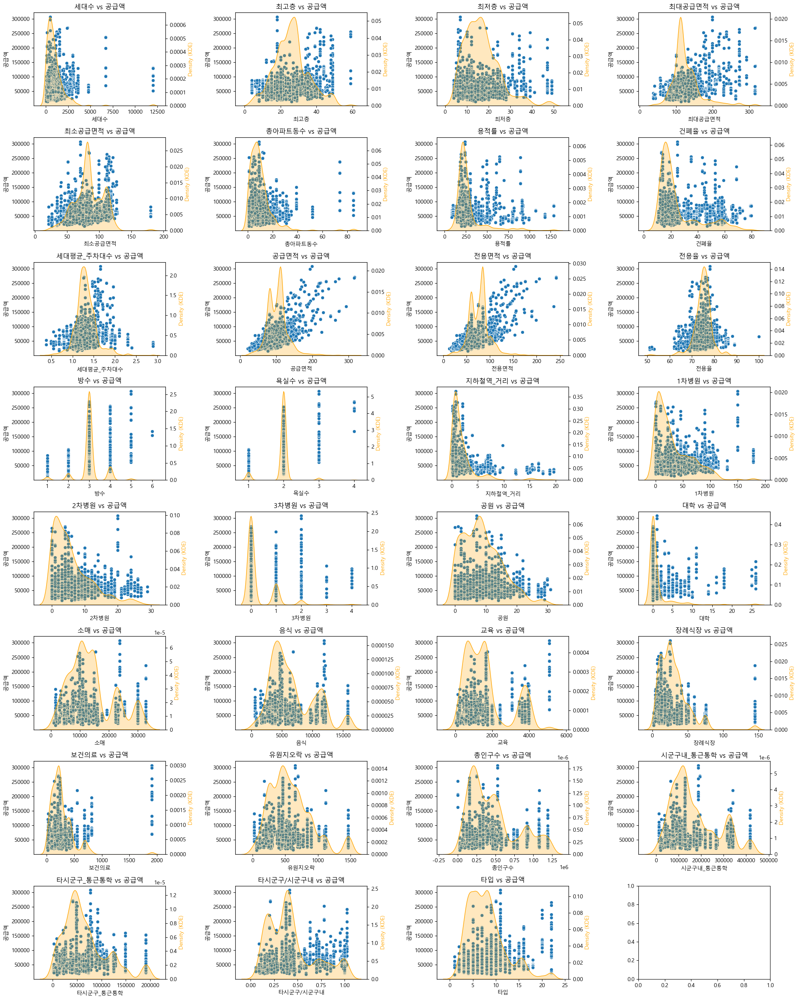

In [20]:
fig, axes = plt.subplots(nrows=8, ncols=4, figsize=(20, 25))

for i, col in enumerate(df_encoded[con_list].columns):  
    row_idx = i // 4
    col_idx = i % 4
    ax = axes[row_idx, col_idx]
    
    sns.scatterplot(x=df_encoded[col], y=df_encoded[y_val_col[0]], ax=ax)
    ax.set_xlabel(col)
    ax.set_ylabel('공급액')
    ax.set_title(f'{col} vs 공급액')
    
    # Twin the axes for two different y-axes on the same plot
    ax2 = ax.twinx()
    sns.kdeplot(df_encoded[col], shade=True, ax=ax2, color='orange')
    ax2.set_ylabel('Density (KDE)', color='orange')
    
plt.tight_layout()
plt.show()

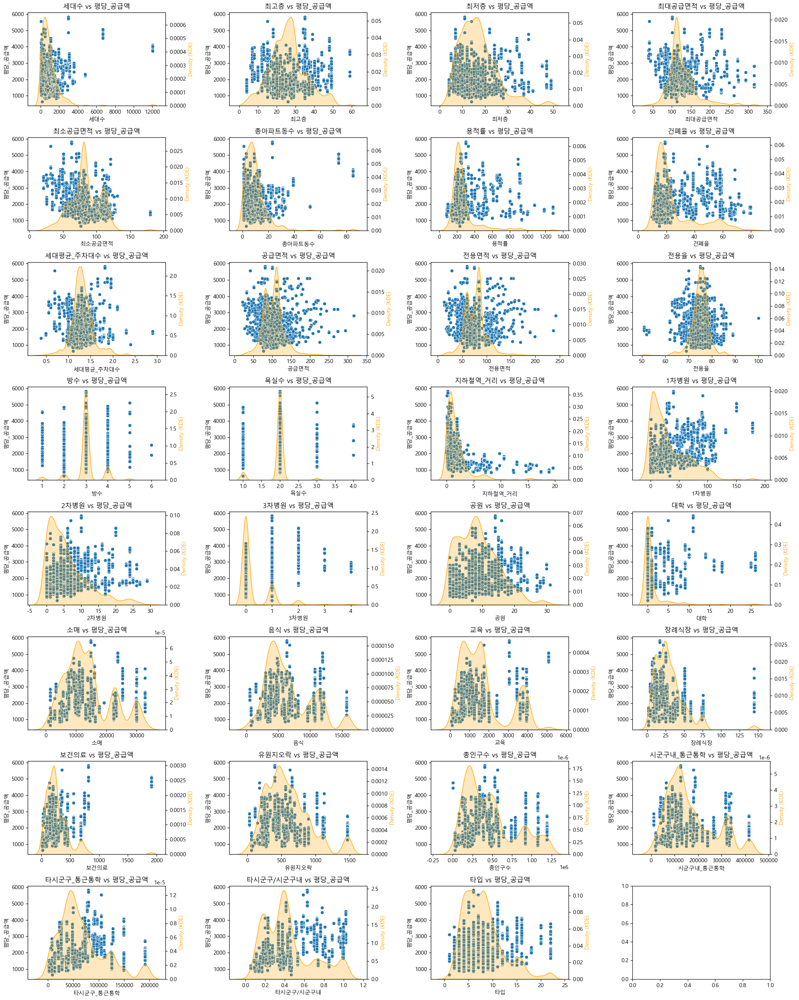

In [21]:
fig, axes = plt.subplots(nrows=8, ncols=4, figsize=(20, 25))

for i, col in enumerate(df_encoded[con_list].columns):  
    row_idx = i // 4
    col_idx = i % 4
    ax = axes[row_idx, col_idx]
    
    sns.scatterplot(x=df_encoded[col], y=df_encoded[y_val_col[1]], ax=ax)
    ax.set_xlabel(col)
    ax.set_ylabel('평당_공급액')
    ax.set_title(f'{col} vs 평당_공급액')
    
    # Twin the axes for two different y-axes on the same plot
    ax2 = ax.twinx()
    sns.kdeplot(df_encoded[col], shade=True, ax=ax2, color='orange')
    ax2.set_ylabel('Density (KDE)', color='orange')
    
plt.tight_layout()
plt.show()

#### 아웃라이어를 제외하고 시각화

In [7]:
# Define a function to remove outliers using IQR method
def remove_outliers(df, column, threshold=1.5):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - threshold * IQR
    upper_bound = Q3 + threshold * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

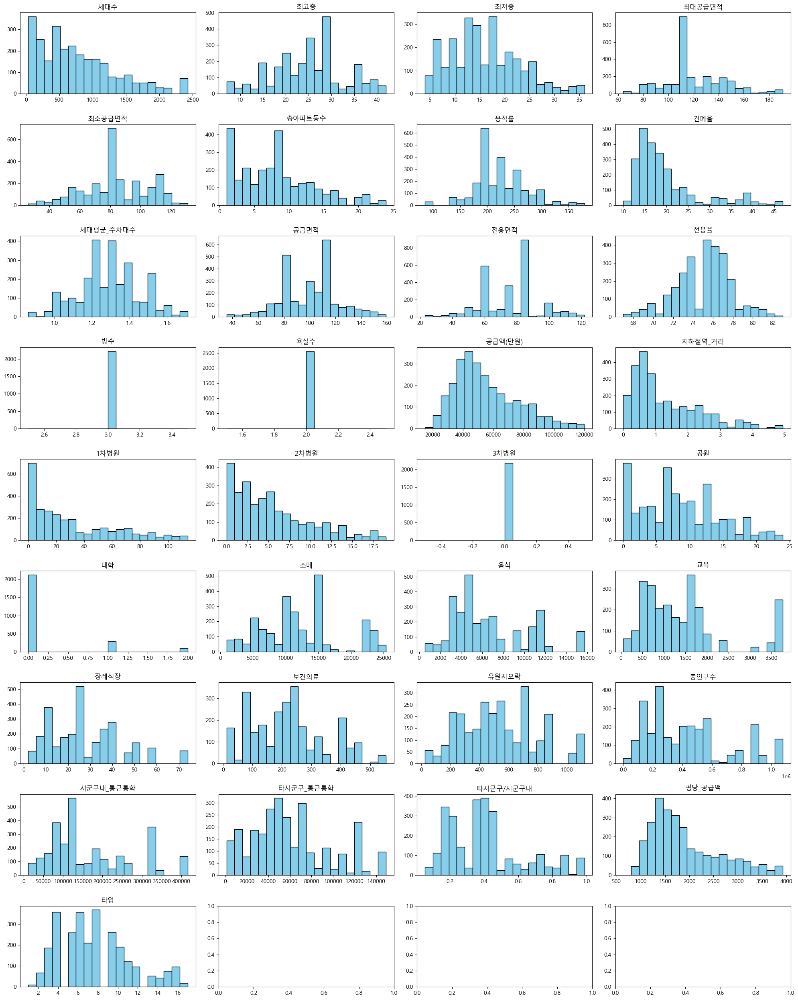

In [72]:
fig, axes = plt.subplots(nrows=9, ncols=4, figsize=(20, 25))

plot_df = df_encoded.drop(one_hot_encoded_columns, axis=1)

for i, col in enumerate(plot_df.columns):
    row_idx = i // 4
    col_idx = i % 4
    ax = axes[row_idx, col_idx]
    
    df_no_outliers = remove_outliers(df_encoded, col)
    
    # 히스토그램을 그립니다.
    ax.hist(df_no_outliers[col], bins=20, color='skyblue', edgecolor='black')
    
    # 플롯 제목 설정
    ax.set_title(col)
    
    
plt.tight_layout()
plt.show()

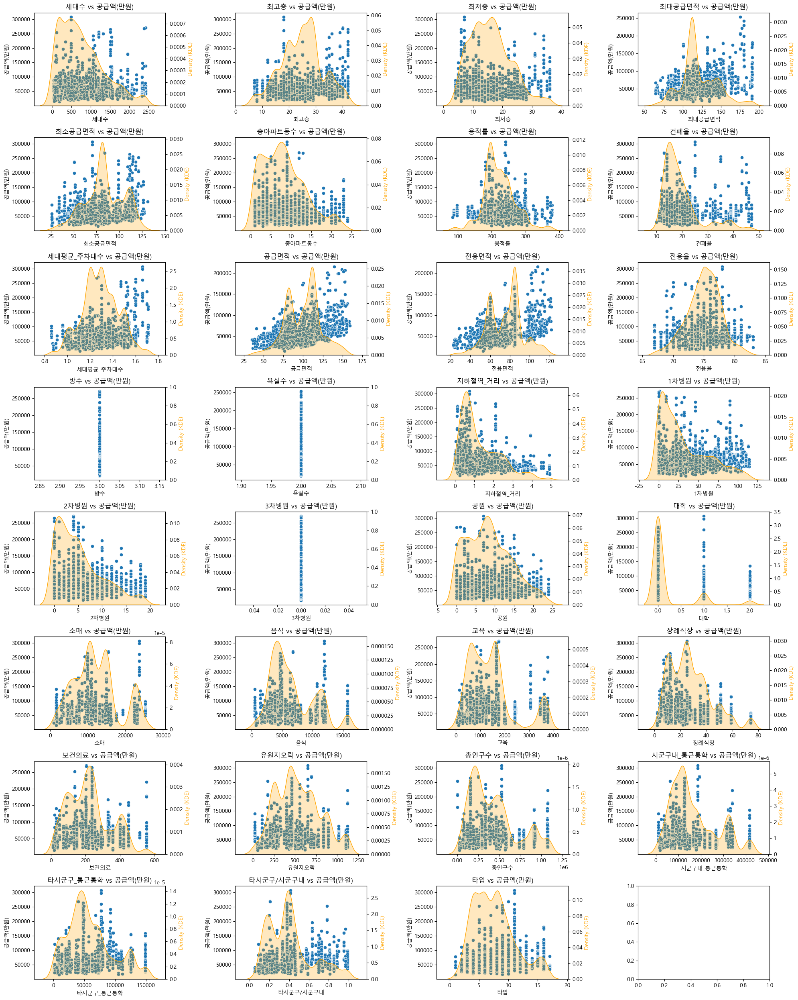

In [ ]:
# Your existing code
fig, axes = plt.subplots(nrows=8, ncols=4, figsize=(20, 25))

for i, col in enumerate(df_encoded[con_list].columns):  
    # ... (rest of your existing code)
    row_idx = i // 4
    col_idx = i % 4
    ax = axes[row_idx, col_idx]
    
    # Remove outliers from the column before plotting
    df_no_outliers = remove_outliers(df_encoded, col)
    
    sns.scatterplot(x=df_no_outliers[col], y=df_no_outliers[y_val_col[0]], ax=ax)
    ax.set_xlabel(col)
    ax.set_ylabel(y_val_col[0])
    ax.set_title(f'{col} vs {y_val_col[0]}')
    
    ax2 = ax.twinx()
    sns.kdeplot(df_no_outliers[col], shade=True, ax=ax2, color='orange')
    ax2.set_ylabel('Density (KDE)', color='orange')
    
plt.tight_layout()
plt.show()

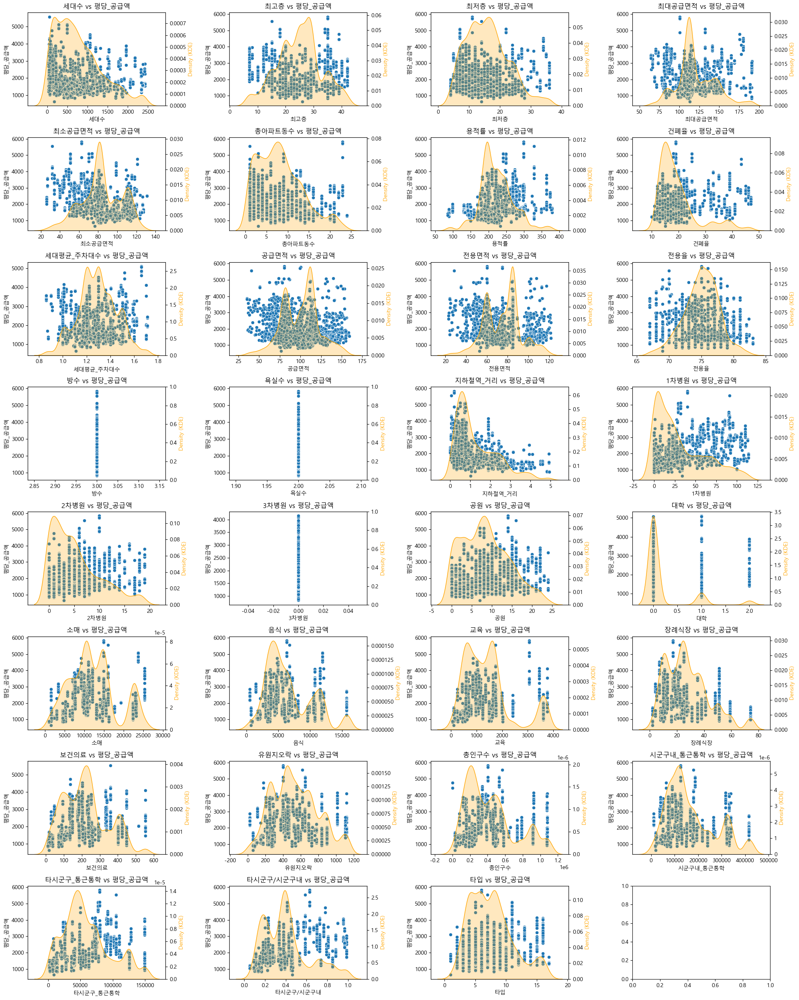

In [ ]:
# Your existing code
fig, axes = plt.subplots(nrows=8, ncols=4, figsize=(20, 25))

for i, col in enumerate(df_encoded[con_list].columns):  
    # ... (rest of your existing code)
    row_idx = i // 4
    col_idx = i % 4
    ax = axes[row_idx, col_idx]
    
    # Remove outliers from the column before plotting
    df_no_outliers = remove_outliers(df_encoded, col)
    
    sns.scatterplot(x=df_no_outliers[col], y=df_no_outliers[y_val_col[1]], ax=ax)
    ax.set_xlabel(col)
    ax.set_ylabel(y_val_col[1])
    ax.set_title(f'{col} vs {y_val_col[1]}')
    
    ax2 = ax.twinx()
    sns.kdeplot(df_no_outliers[col], shade=True, ax=ax2, color='orange')
    ax2.set_ylabel('Density (KDE)', color='orange')
    
plt.tight_layout()
plt.show()

#### 카테고리 컬럼

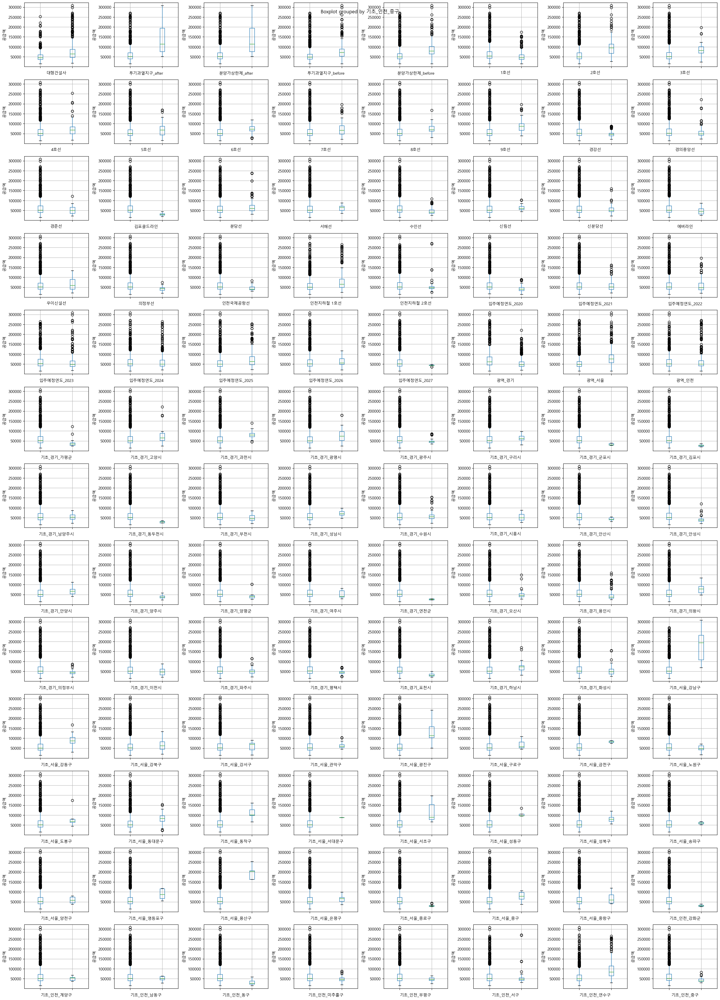

In [22]:
fig, axes = plt.subplots(nrows=13, ncols=8, figsize=(25, 35))

for i, col in enumerate(df_encoded[one_hot_encoded_columns].columns):  # 공급액 컬럼은 제외
    row_idx = i // 8
    col_idx = i % 8
    ax = axes[row_idx, col_idx]
    df_encoded.boxplot(column=y_val_col[0], by=col, ax=ax)
    ax.set_title('')
    ax.set_xlabel(col)
    ax.set_ylabel('공급액')
    ax.set_xticklabels([])

plt.tight_layout()
plt.show()

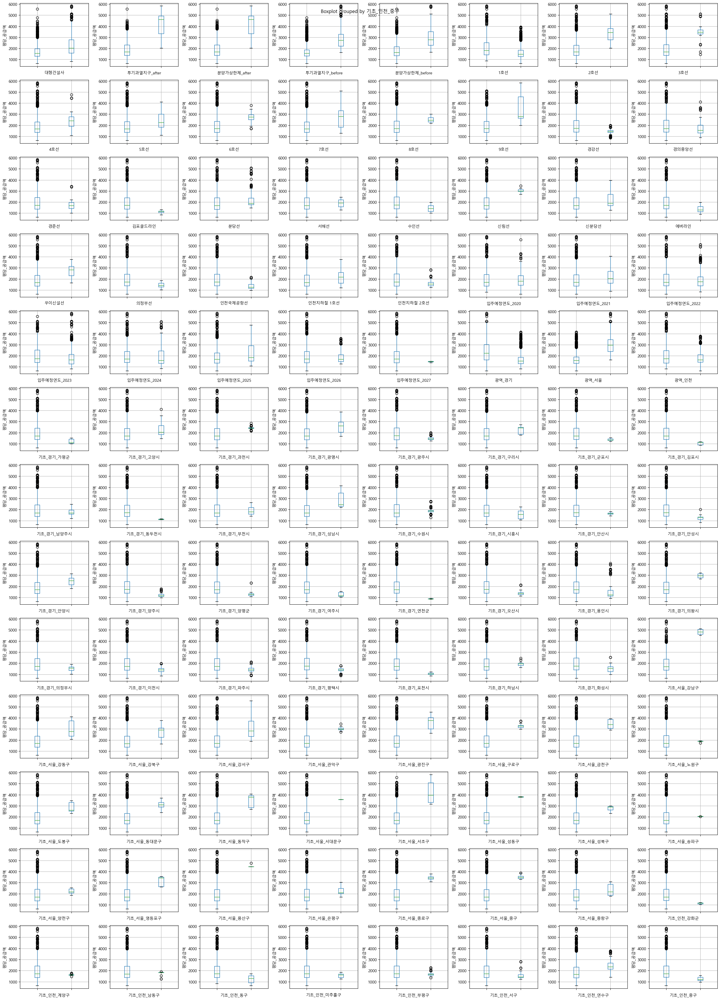

In [23]:
fig, axes = plt.subplots(nrows=13, ncols=8, figsize=(25, 35))

for i, col in enumerate(df_encoded[one_hot_encoded_columns].columns):  # 공급액 컬럼은 제외
    row_idx = i // 8
    col_idx = i % 8
    ax = axes[row_idx, col_idx]
    df_encoded.boxplot(column=y_val_col[1], by=col, ax=ax)
    ax.set_title('')
    ax.set_xlabel(col)
    ax.set_ylabel('평당_공급액')
    ax.set_xticklabels([])

plt.tight_layout()
plt.show()

#### 100개 이상인 컬럼만

In [11]:
column_sums = df_encoded[one_hot_encoded_columns].sum()

columns_with_sum_above_100 = column_sums[column_sums >= 100].index.tolist()

print("Columns with sum above 100:", columns_with_sum_above_100)

Columns with sum above 100: ['대형건설사', '투기과열지구_before', '분양가상한제_before', '1호선', '4호선', '5호선', '7호선', '경강선', '경의중앙선', '분당선', '수인선', '에버라인', '인천지하철 1호선', '인천지하철 2호선', '입주예정연도_2021', '입주예정연도_2022', '입주예정연도_2023', '입주예정연도_2024', '입주예정연도_2025', '입주예정연도_2026', '광역_경기', '광역_서울', '광역_인천', '기초_경기_수원시', '기초_경기_파주시', '기초_경기_평택시', '기초_경기_화성시', '기초_인천_서구', '기초_인천_연수구']


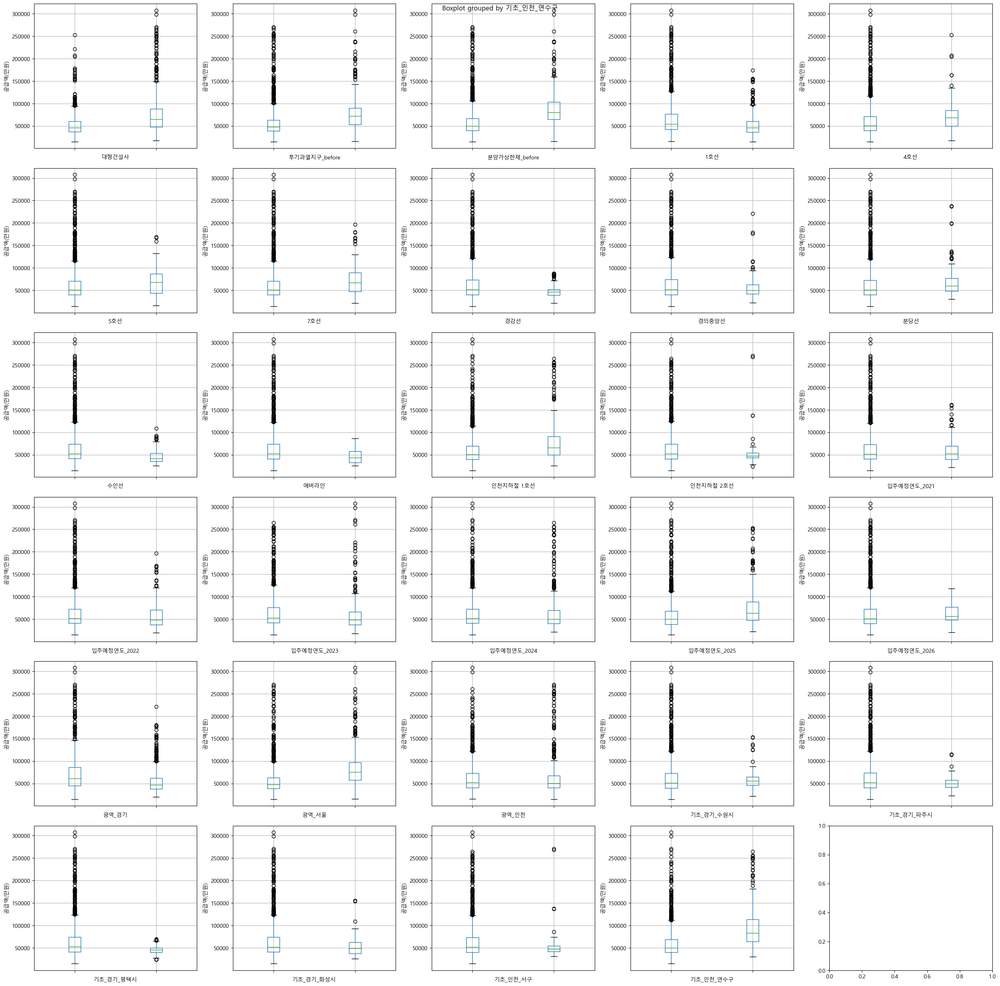

In [25]:
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(25, 25))

for i, col in enumerate(df_encoded[columns_with_sum_above_100].columns): 
    row_idx = i // 5
    col_idx = i % 5
    ax = axes[row_idx, col_idx]
    df_encoded.boxplot(column=y_val_col[0], by=col, ax=ax)
    ax.set_title('')
    ax.set_xlabel(col)
    ax.set_ylabel(y_val_col[0])
    ax.set_xticklabels([])

plt.tight_layout()
plt.show()

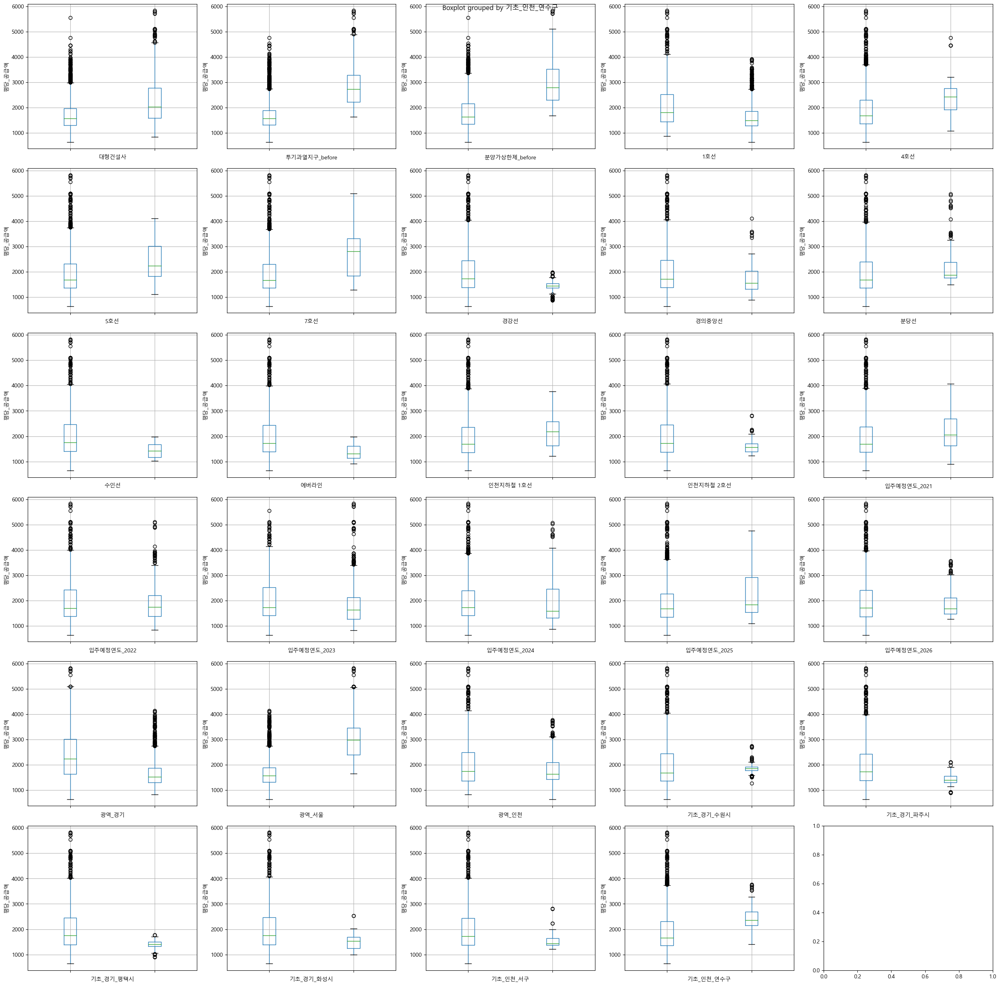

In [26]:
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(25, 25))

for i, col in enumerate(df_encoded[columns_with_sum_above_100].columns):  # 공급액 컬럼은 제외
    row_idx = i // 5
    col_idx = i % 5
    ax = axes[row_idx, col_idx]
    df_encoded.boxplot(column=y_val_col[1], by=col, ax=ax)
    ax.set_title('')
    ax.set_xlabel(col)
    ax.set_ylabel(y_val_col[1])
    ax.set_xticklabels([])

plt.tight_layout()
plt.show()

### 모든변수 사용

In [12]:
target_df = df_encoded[y_val_col]

In [31]:
X = df_y_drop2
y = target_df.iloc[:,0]

In [8]:
# 모델들과 모델명 리스트 준비
linear_models = [
    ('Ridge', Ridge(alpha=1.0)),
    ('Lasso', Lasso(alpha=1.0)),
    ('Ordinary Least Squares', LinearRegression())
]

In [10]:
def results_predictions(results, y_test):
    # 결과 저장용 리스트 초기화
    performance_metrics = []

    # 각 선형 모델의 예측 값에 대한 성능 메트릭 계산
    for result in results:
        model_name = result['model']
        y_pred = result['predictions']
        
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        mae = mean_absolute_error(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)
        
        performance_metrics.append({
            'model': model_name,
            'RMSE': rmse,
            'MAE': mae,
            'MSE': mse,
            'R2': r2
        })
        
    # 모델명과 해당 모델의 성능 메트릭을 출력
    for metrics in performance_metrics:
        print(f"{metrics['model']} - RMSE: {metrics['RMSE']:.2f}, MAE: {metrics['MAE']:.2f}, MSE: {metrics['MSE']:.2f}, R2: {metrics['R2']:.4f}")
        
    return performance_metrics

In [11]:
def linear_models_fit(models, X, y, test_size=0.2, random_seed=42, data_results=False):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_seed)
    
    linear_results = []
    for model_name, model in models:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        coef = model.coef_  # 회귀 계수 (영향력)
        
        # 결과 저장
        linear_results.append({
            'model': model_name,
            'predictions': y_pred,
            'coefficients': coef
        })
    
    performance_metrics = results_predictions(linear_results, y_test)

    if data_results is True:
        return linear_results, performance_metrics

In [35]:
linear_models_fit(linear_models, X, y)

Ridge - RMSE: 10822.96, MAE: 8010.34, MSE: 117136517.41, R2: 0.8590
Lasso - RMSE: 10766.92, MAE: 7957.91, MSE: 115926631.76, R2: 0.8604
Ordinary Least Squares - RMSE: 10757.31, MAE: 7946.04, MSE: 115719667.84, R2: 0.8607


In [12]:
def tree_models_fit(models, X, y, test_size=0.2, random_seed=42, data_results=False):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_seed)
    
    tree_results = []
    for model_name, model in models:
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        feature_importances = model.feature_importances_
        
        # 결과 저장
        tree_results.append({
            'model': model_name,
            'predictions': y_pred,
            'feature_importances': feature_importances
        })
    
    performance_metrics = results_predictions(tree_results, y_test)

    if data_results is True:
        return tree_results, performance_metrics

In [13]:
# 모델들과 모델명 리스트 준비
tree_models = [
    ('Random Forest', RandomForestRegressor(n_estimators=1000, random_state=42)),
    ('ExtraTrees', ExtraTreesRegressor(n_estimators=1000, random_state=42)),
    ('LightGBM', lgb.LGBMRegressor(n_estimators=1000, random_state=42)),
    ('XGBoost', xgb.XGBRegressor(n_estimators=1000, random_state=42)),
    ('CatBoost', CatBoostRegressor(iterations=1000, depth=12, learning_rate=0.1, loss_function='RMSE', random_state=42, verbose=0))
]

In [38]:
tree_models_fit(tree_models, X, y)

Random Forest - RMSE: 6890.56, MAE: 3851.15, MSE: 47479797.45, R2: 0.9428
ExtraTrees - RMSE: 5885.66, MAE: 2831.48, MSE: 34641033.98, R2: 0.9583
LightGBM - RMSE: 5677.36, MAE: 2815.57, MSE: 32232403.10, R2: 0.9612
XGBoost - RMSE: 6407.30, MAE: 3075.08, MSE: 41053544.14, R2: 0.9506
CatBoost - RMSE: 5828.03, MAE: 2793.89, MSE: 33965895.31, R2: 0.9591


### EDA후 임의 선택

In [46]:
# select_list3.append('공급액')

In [47]:
# X = df_y_drop2[select_list3]
# y = target_df.iloc[:, 0]

In [ ]:
# linear_models_fit(linear_models, X, y)

Ridge - RMSE: 15515.53, MAE: 11505.42, MSE: 240731741.08, R2: 0.7242
Lasso - RMSE: 15530.88, MAE: 11531.14, MSE: 241208286.99, R2: 0.7236
Ordinary Least Squares - RMSE: 15532.79, MAE: 11533.92, MSE: 241267695.23, R2: 0.7236


##### 비교
- Ridge - RMSE: 10822.96, MAE: 8010.34, MSE: 117136517.41, R2: 0.8590
- Lasso - RMSE: 10766.92, MAE: 7957.91, MSE: 115926631.76, R2: 0.8604
- Ordinary Least Squares - RMSE: 10757.31, MAE: 7946.04, MSE: 115719667.84, R2: 0.8607

In [ ]:
# tree_models_fit(tree_models, X, y)

Random Forest - RMSE: 10529.65, MAE: 5695.80, MSE: 110873613.66, R2: 0.8730
ExtraTrees - RMSE: 7432.57, MAE: 3519.01, MSE: 55243144.12, R2: 0.9367
LightGBM - RMSE: 10597.60, MAE: 4695.01, MSE: 112309183.01, R2: 0.8713
XGBoost - RMSE: 8315.55, MAE: 4005.68, MSE: 69148450.00, R2: 0.9208
CatBoost - RMSE: 6152.96, MAE: 3207.14, MSE: 37858975.72, R2: 0.9566


##### 비교
- Random Forest - RMSE: 6890.56, MAE: 3851.15, MSE: 47479797.45, R2: 0.9428
- ExtraTrees - RMSE: 5885.66, MAE: 2831.48, MSE: 34641033.98, R2: 0.9583
- LightGBM - RMSE: 5677.36, MAE: 2815.57, MSE: 32232403.10, R2: 0.9612
- XGBoost - RMSE: 6407.30, MAE: 3075.08, MSE: 41053544.14, R2: 0.9506
- CatBoost - RMSE: 5828.03, MAE: 2793.89, MSE: 33965895.31, R2: 0.9591

### 기계적 변수 선택
- SelectKBest
- RFE
- SFS

In [15]:
# 모델들과 모델명 리스트 준비
using_models = [
    ('Ordinary Least Squares', LinearRegression()),
    ('Random Forest', RandomForestRegressor(n_estimators=1000, random_state=42, n_jobs=-1)),
    ('ExtraTrees', ExtraTreesRegressor(n_estimators=1000, random_state=42, n_jobs=-1)),
    ('LightGBM', lgb.LGBMRegressor(n_estimators=1000, random_state=42, n_jobs=-1)),
    ('XGBoost', xgb.XGBRegressor(n_estimators=1000, random_state=42, n_jobs=-1)),
    ('CatBoost', CatBoostRegressor(n_estimators=2500, random_state=42, verbose=0))
]

In [14]:
def features_select(models, X, y, selector='Kbest', test_size=0.2, random_seed=42, num_selected_features = 50, data_results=False):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_seed)

    results = {}

    if selector == 'RFE':
        for name, model in models:
            rfe = RFE(model, n_features_to_select=num_selected_features)
            rfe.fit(X_train, y_train)
            
            selected_features = np.where(rfe.support_)[0]
            
            results[name] = list(selected_features)
            print(f"Selected features for {name}: {selected_features}")

    elif selector == 'SFS':
        for name, model in models:
            sfs = SequentialFeatureSelector(model, n_features_to_select=num_selected_features, direction='forward', n_jobs=-1)
            sfs.fit(X_train, y_train)

            selected_features = np.where(sfs.get_support())[0]
            results[name] = list(selected_features)
            print(f"Selected features for SFS: {selected_features}")
            
    else:
        for name, model in models:
            selector = SelectKBest(score_func=mutual_info_regression, k=num_selected_features)
            selector.fit(X_train, y_train)
            
            selected_features = np.where(selector.get_support())[0]
            results[name] = list(selected_features)
            print(f"Selected features for {name}: {selected_features}")
            
    if data_results is True:
        return results

In [393]:
X = df_y_drop2
y = target_df.iloc[:,0]

In [394]:
Kbest_50_selects2 = features_select(using_models, X, y, data_results=True)

Selected features for Ordinary Least Squares: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  37  42
  43  54  55  56  60  62  65  66  67  95  98 100 130 131]
Selected features for Random Forest: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  36
  37  42  43  55  56  60  62  65  66  67  95  98 100 130]
Selected features for ExtraTrees: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  37
  42  51  55  56  60  62  65  66  67  72  95  98 100 130]
Selected features for LightGBM: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  37
  42  43  55  56  60  62  65  66  67  72  95 100 130 131]
Selected features for XGBoost: [  0

In [42]:
Kbest_50_selects = features_select(using_models, X, y, data_results=True)

Selected features for Ordinary Least Squares: [  0   1   3   4   5   6   8   9  11  12  13  14  15  16  17  19  22  23
  24  27  28  29  30  31  32  33  34  35  39  41  42  45  48  51  53  55
  57  62  65  66  85  95  99 100 104 110 112 118 127 130]
Selected features for Random Forest: [  0   1   3   4   5   6   8   9  11  12  13  14  15  16  17  19  22  23
  24  27  28  29  30  31  32  33  34  35  39  41  42  45  48  51  53  55
  57  62  65  66  85  95  99 100 104 110 112 118 127 130]
Selected features for ExtraTrees: [  0   1   3   4   5   6   8   9  11  12  13  14  15  16  17  19  22  23
  24  27  28  29  30  31  32  33  34  35  39  41  42  45  48  51  53  55
  57  62  65  66  85  95  99 100 104 110 112 118 127 130]
Selected features for LightGBM: [  0   1   3   4   5   6   8   9  11  12  13  14  15  16  17  19  22  23
  24  27  28  29  30  31  32  33  34  35  39  41  42  45  48  51  53  55
  57  62  65  66  85  95  99 100 104 110 112 118 127 130]
Selected features for XGBoost: [  0

In [ ]:
RFE_50_select = features_select(using_models[1:2], X, y, selector='RFE', data_results=True)

In [159]:
X = df_y_drop2.iloc[:, RFE_50_select['Random Forest']]
y = target_df.iloc[:, 0]

In [17]:
def tree_models_kfold(X, y, test_size=0.2, random_seed=42, n_splits=5, data_results=False):
    kf = KFold(n_splits=n_splits, random_state=42, shuffle=True)
    
    score_list = {'RMSE': [],
                  'MAE': [],
                  'MSE': [],
                  'R2': [],
                  'train_RMSE': [],
                  'train_MAE': [],
                  'train_MSE': [],
                  'train_R2': []}
    
    model_name = 'CatBoost'
    model = CatBoostRegressor(n_estimators=2500, random_state=42, verbose=0)
    best = {'bagging_temperature': 1.2, 'colsample_bylevel': 0.95, 'depth': 6, 'l2_leaf_reg': 4, 'learning_rate': 0.2}
    model.set_params(**best)
    
    for train_index, test_index in kf.split(X):
        
        performance_metrics = []
        tree_results = []
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        
        eval_set = [(X_test, y_test)]
        
        
        model.fit(X_train, y_train, eval_set=eval_set, early_stopping_rounds=200)
        
        y_pred = model.predict(X_train)
        rmse = np.sqrt(mean_squared_error(y_train, y_pred))
        mae = mean_absolute_error(y_train, y_pred)
        mse = mean_squared_error(y_train, y_pred)
        r2 = r2_score(y_train, y_pred)
        
        score_list['train_RMSE'].append(float(rmse))
        score_list['train_MAE'].append(float(mae))
        score_list['train_MSE'].append(float(mse))
        score_list['train_R2'].append(float(r2))

        
        y_pred = model.predict(X_test)
        feature_importances = model.feature_importances_
    
        # 결과 저장
        tree_results.append({
            'model': model_name,
            'predictions': y_pred,
            'feature_importances': feature_importances
        })
        
        performance_metrics = results_predictions(tree_results, y_test)
        
        
        score_list['RMSE'].append(float(performance_metrics[0]['RMSE']))
        score_list['MAE'].append(float(performance_metrics[0]['MAE']))
        score_list['MSE'].append(float(performance_metrics[0]['MSE']))
        score_list['R2'].append(float(performance_metrics[0]['R2']))

    if data_results is True:
        return tree_results, score_list

In [18]:
X = df_y_drop2
y = target_df.iloc[:, 0]

result_list2 = {'cols': [],
               'RMSE': [],
                'MAE': [],
                'MSE': [],
                'R2': [],
                'train_RMSE': [],
                'train_MAE': [],
                'train_MSE': [],
                'train_R2': []}

col_list = list(X.keys())

for n in range(60, 0, -1):
    RFE_50_select = features_select(using_models[5:6], X[col_list], y, data_results=True, num_selected_features=n)
    X = df_y_drop2[col_list]
    X = X.iloc[:, RFE_50_select['CatBoost']]
    y = target_df.iloc[:, 0]
    result1, result2 = tree_models_kfold(X, y, n_splits=10,  data_results=True)
    col_list = list(X.keys())
    
    result_list2['cols'].append(col_list)
    result_list2['train_RMSE'].append(np.mean(result2['train_RMSE']))
    result_list2['train_MAE'].append(np.mean(result2['train_MAE']))
    result_list2['train_MSE'].append(np.mean(result2['train_MSE']))
    result_list2['train_R2'].append(np.mean(result2['train_R2']))
    result_list2['RMSE'].append(np.mean(result2['RMSE']))
    result_list2['MAE'].append(np.mean(result2['MAE']))
    result_list2['MSE'].append(np.mean(result2['MSE']))
    result_list2['R2'].append(np.mean(result2['R2']))

Selected features for CatBoost: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  32  33  35  37  38
  39  47  50  51  52  55  56  57  58  59  61  62  63  66  68  81  86  89
  91  94  96 115 126 127]
CatBoost - RMSE: 4932.02, MAE: 2134.64, MSE: 24324835.46, R2: 0.9631
CatBoost - RMSE: 5323.70, MAE: 2748.96, MSE: 28341763.60, R2: 0.9716
CatBoost - RMSE: 5323.03, MAE: 2401.17, MSE: 28334643.15, R2: 0.9739
CatBoost - RMSE: 4824.75, MAE: 2526.03, MSE: 23278238.52, R2: 0.9709
CatBoost - RMSE: 7114.54, MAE: 2966.79, MSE: 50616709.91, R2: 0.9646
CatBoost - RMSE: 4047.20, MAE: 2356.96, MSE: 16379865.63, R2: 0.9833
CatBoost - RMSE: 11495.42, MAE: 4051.37, MSE: 132144708.42, R2: 0.9178
CatBoost - RMSE: 3726.07, MAE: 1990.32, MSE: 13883608.62, R2: 0.9782
CatBoost - RMSE: 4106.31, MAE: 2209.28, MSE: 16861753.83, R2: 0.9876
CatBoost - RMSE: 5071.48, MAE: 2676.73, MSE: 25719885.96, R2: 0.9835
Selected features for CatBoost:

In [310]:
X = df_y_drop2
y = target_df.iloc[:, 0]

result_list = {'cols': [],
               'RMSE': [],
                'MAE': [],
                'MSE': [],
                'R2': [],
                'train_RMSE': [],
                'train_MAE': [],
                'train_MSE': [],
                'train_R2': []}

col_list = list(X.keys())

for n in range(60, 0, -1):
    RFE_50_select = features_select(using_models[5:6], X[col_list], y, selector='RFE', data_results=True, num_selected_features=n)
    X = df_y_drop2[col_list]
    X = X.iloc[:, RFE_50_select['CatBoost']]
    y = target_df.iloc[:, 0]
    result1, result2 = tree_models_kfold(X, y, n_splits=10,  data_results=True)
    col_list = list(X.keys())
    
    result_list['cols'].append(col_list)
    result_list['train_RMSE'].append(np.mean(result2['train_RMSE']))
    result_list['train_MAE'].append(np.mean(result2['train_MAE']))
    result_list['train_MSE'].append(np.mean(result2['train_MSE']))
    result_list['train_R2'].append(np.mean(result2['train_R2']))
    result_list['RMSE'].append(np.mean(result2['RMSE']))
    result_list['MAE'].append(np.mean(result2['MAE']))
    result_list['MSE'].append(np.mean(result2['MSE']))
    result_list['R2'].append(np.mean(result2['R2']))

Selected features for CatBoost: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  36
  39  41  46  48  51  57  59  60  61  62  63  65  66  67  73  79  84  90
  98 106 114 122 127 130]
Random Forest - RMSE: 4927.13, MAE: 2068.80, MSE: 24276569.19, R2: 0.9632
Random Forest - RMSE: 5241.57, MAE: 2793.31, MSE: 27474010.25, R2: 0.9724
Random Forest - RMSE: 6020.83, MAE: 2597.84, MSE: 36250388.57, R2: 0.9666
Random Forest - RMSE: 4240.38, MAE: 2424.64, MSE: 17980857.49, R2: 0.9775
Random Forest - RMSE: 8284.55, MAE: 2994.91, MSE: 68633760.71, R2: 0.9521
Random Forest - RMSE: 3821.33, MAE: 2265.23, MSE: 14602576.32, R2: 0.9851
Random Forest - RMSE: 11933.81, MAE: 3611.68, MSE: 142415747.61, R2: 0.9114
Random Forest - RMSE: 3944.09, MAE: 2011.37, MSE: 15555852.08, R2: 0.9756
Random Forest - RMSE: 4261.00, MAE: 2233.39, MSE: 18156081.59, R2: 0.9867
Random Forest - RMSE: 4520.00, MAE: 2557.08, MSE: 20430

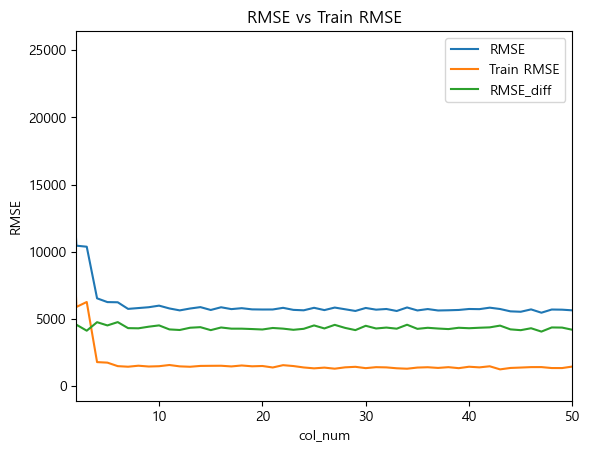

In [375]:
x_values = list(range(60, 0, -1))
RMSE_diff = np.array(result_list['RMSE']) - np.array(result_list['train_RMSE'])

# 그래프를 그립니다.
plt.plot(x_values, result_list['RMSE'], label='RMSE')
plt.plot(x_values, result_list['train_RMSE'], label='Train RMSE')
plt.plot(x_values, RMSE_diff, label='RMSE_diff')

# 그래프에 제목과 축 레이블을 추가합니다.
plt.title('RMSE vs Train RMSE')
plt.xlabel('col_num')
plt.ylabel('RMSE')
plt.xlim(2, 50)

# 범례를 추가합니다.
plt.legend()

# 그래프를 표시합니다.
plt.show()

In [347]:
np.min(RMSE_diff[:-1]), RMSE_diff[13]

(4049.759819179675, 4049.759819179675)

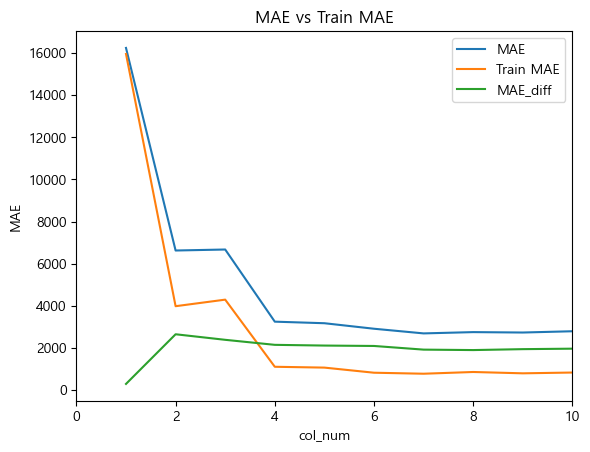

In [338]:
x_values = list(range(60, 0, -1))
MAE_diff = np.array(result_list['MAE']) - np.array(result_list['train_MAE'])

# 그래프를 그립니다.
plt.plot(x_values, result_list['MAE'], label='MAE')
plt.plot(x_values, result_list['train_MAE'], label='Train MAE')
plt.plot(x_values, MAE_diff, label='MAE_diff')

# 그래프에 제목과 축 레이블을 추가합니다.
plt.title('MAE vs Train MAE')
plt.xlabel('col_num')
plt.ylabel('MAE')

# 범례를 추가합니다.
plt.legend()
plt.xlim(0, 10)

# 그래프를 표시합니다.
plt.show()

In [352]:
np.min(MAE_diff[:-1]), MAE_diff[1]

(1759.0489117669163, 1759.0489117669163)

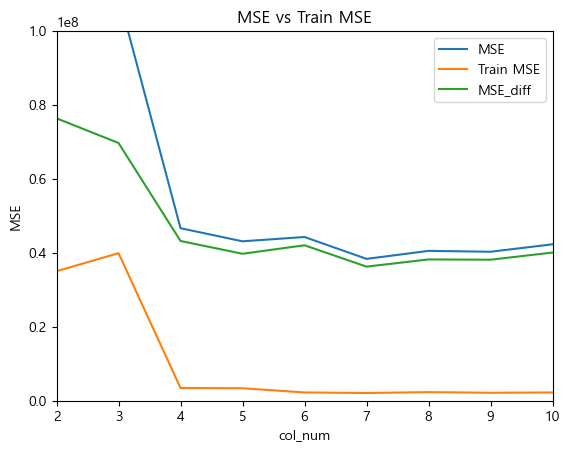

In [337]:
x_values = list(range(60, 0, -1))
MSE_diff = np.array(result_list['MSE']) - np.array(result_list['train_MSE'])

# 그래프를 그립니다.
plt.plot(x_values, result_list['MSE'], label='MSE')
plt.plot(x_values, result_list['train_MSE'], label='Train MSE')
plt.plot(x_values, MSE_diff, label='MSE_diff')

# 그래프에 제목과 축 레이블을 추가합니다.
plt.title('MSE vs Train MSE')
plt.xlabel('col_num')
plt.ylabel('MSE')

# 범례를 추가합니다.
plt.legend()
plt.xlim(2, 10)
plt.ylim(0, 100000000)

# 그래프를 표시합니다.
plt.show()

In [353]:
np.min(MSE_diff[:-1]), MSE_diff[1]

(32368886.986106373, 32368886.986106373)

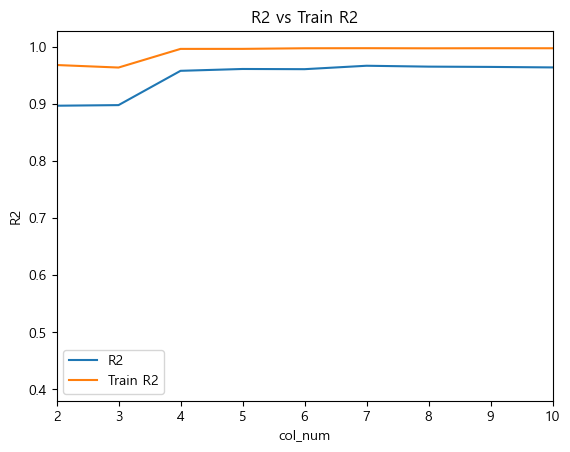

In [354]:
x_values = list(range(60, 0, -1))
R2_diff = np.array(result_list['R2']) - np.array(result_list['train_R2'])

# 그래프를 그립니다.
plt.plot(x_values, result_list['R2'], label='R2')
plt.plot(x_values, result_list['train_R2'], label='Train R2')
# plt.plot(x_values, R2_diff, label='R2_diff')

# 그래프에 제목과 축 레이블을 추가합니다.
plt.title('R2 vs Train R2')
plt.xlabel('col_num')
plt.ylabel('R2')

# 범례를 추가합니다.
plt.legend()
plt.xlim(2, 10)

# 그래프를 표시합니다.
plt.show()

In [388]:
len(result_list['cols'][13]), result_list['cols'][13]

(47,
 ['세대수',
  '최고층',
  '최저층',
  '최대공급면적',
  '최소공급면적',
  '총아파트동수',
  '용적률',
  '건폐율',
  '세대평균_주차대수',
  '공급면적',
  '전용율',
  '방수',
  '욕실수',
  '대형건설사',
  '지하철역_거리',
  '1차병원',
  '2차병원',
  '3차병원',
  '공원',
  '대학',
  '소매',
  '음식',
  '교육',
  '장례식장',
  '보건의료',
  '유원지오락',
  '총인구수',
  '투기과열지구_after',
  '분양가상한제_after',
  '투기과열지구_before',
  '타시군구/시군구내',
  '타입',
  '7호선',
  '9호선',
  '분당선',
  '수인선',
  '입주예정연도_2020',
  '입주예정연도_2022',
  '입주예정연도_2023',
  '입주예정연도_2024',
  '입주예정연도_2025',
  '광역_경기',
  '광역_서울',
  '광역_인천',
  '기초_경기_안양시',
  '기초_경기_용인시',
  '기초_인천_연수구'])

#### test cat boost

In [19]:
col_list = ['세대수',
  '최고층',
  '최저층',
  '최대공급면적',
  '최소공급면적',
  '총아파트동수',
  '용적률',
  '건폐율',
  '세대평균_주차대수',
  '공급면적',
  '전용율',
  '방수',
  '욕실수',
  '대형건설사',
  '지하철역_거리',
  '1차병원',
  '2차병원',
  '3차병원',
  '공원',
  '대학',
  '소매',
  '음식',
  '교육',
  '장례식장',
  '보건의료',
  '유원지오락',
  '총인구수',
  '타시군구/시군구내',
  '타입',
  '7호선',
  '9호선',
  '분당선',
  '수인선',
  '입주예정연도_2020',
  '입주예정연도_2022',
  '입주예정연도_2023',
  '입주예정연도_2024',
  '입주예정연도_2025',
  '광역_경기',
  '광역_서울',
  '광역_인천',
  '기초_경기_안양시',
  '기초_경기_용인시',
  '기초_인천_연수구']

In [20]:
X = df_y_drop2[col_list]
y = target_df.iloc[:, 0]

In [409]:
linear_models_fit(linear_models, X, y)

Ridge - RMSE: 13434.05, MAE: 10045.45, MSE: 180473569.79, R2: 0.7827
Lasso - RMSE: 13434.25, MAE: 10056.16, MSE: 180479155.38, R2: 0.7827
Ordinary Least Squares - RMSE: 13433.91, MAE: 10058.28, MSE: 180469829.90, R2: 0.7827


In [410]:
tree_models_fit(tree_models, X, y)

Random Forest - RMSE: 7137.73, MAE: 3977.97, MSE: 50947219.10, R2: 0.9387
ExtraTrees - RMSE: 5992.61, MAE: 2853.81, MSE: 35911328.43, R2: 0.9568
LightGBM - RMSE: 5751.06, MAE: 2815.78, MSE: 33074639.66, R2: 0.9602
XGBoost - RMSE: 6553.52, MAE: 3140.87, MSE: 42948561.44, R2: 0.9483
CatBoost - RMSE: 5802.47, MAE: 2865.44, MSE: 33668675.55, R2: 0.9595


##### 이전 코드들

In [47]:
RFE_50_select = features_select(using_models[1:2], X, y, selector='RFE', data_results=True)

Selected features for Random Forest: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  36  41
  46  48  50  60  61  62  65  66  67  71  79  84  90 130]


In [ ]:
RFE_40_select = features_select(using_models[1:2], X, y, selector='RFE', num_selected_features=40, data_results=True)

Selected features for Random Forest: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  33  46  49  50  54  55  56
  74 118 123 125]


In [ ]:
SFS_40_select = features_select(using_models[1:2], X, y, selector='SFS', num_selected_features=40, data_results=True)

Selected features for SFS: [  4   8   9  11  16  23  25  26  28  31  32  33  34  39  40  43  46  49
  50  52  53  55  56  60  62  73  74  75  80  84  87  96 105 111 112 114
 120 124 125 126]


### SelectKBest

In [48]:
X = df_y_drop2.iloc[:, Kbest_50_selects['Random Forest']]
y = target_df.iloc[:, 0]

In [44]:
linear_models_fit(linear_models, X, y)

Ridge - RMSE: 13473.94, MAE: 10139.85, MSE: 181546989.91, R2: 0.7814
Lasso - RMSE: 13392.43, MAE: 10039.88, MSE: 179357289.68, R2: 0.7841
Ordinary Least Squares - RMSE: 13388.79, MAE: 10043.12, MSE: 179259730.72, R2: 0.7842


##### 비교
- Ridge - RMSE: 10822.96, MAE: 8010.34, MSE: 117136517.41, R2: 0.8590
- Lasso - RMSE: 10766.92, MAE: 7957.91, MSE: 115926631.76, R2: 0.8604
- Ordinary Least Squares - RMSE: 10757.31, MAE: 7946.04, MSE: 115719667.84, R2: 0.8607

In [49]:
tree_models_fit(tree_models, X, y)

Random Forest - RMSE: 6984.97, MAE: 3888.72, MSE: 48789751.42, R2: 0.9413
ExtraTrees - RMSE: 5937.62, MAE: 2826.09, MSE: 35255284.55, R2: 0.9576
LightGBM - RMSE: 5802.59, MAE: 2830.98, MSE: 33669994.59, R2: 0.9595
XGBoost - RMSE: 5857.34, MAE: 3138.66, MSE: 34308480.98, R2: 0.9587
CatBoost - RMSE: 6090.16, MAE: 2802.60, MSE: 37089999.52, R2: 0.9553


##### 비교
- Random Forest - RMSE: 6890.56, MAE: 3851.15, MSE: 47479797.45, R2: 0.9428
- ExtraTrees - RMSE: 5885.66, MAE: 2831.48, MSE: 34641033.98, R2: 0.9583
- LightGBM - RMSE: 5677.36, MAE: 2815.57, MSE: 32232403.10, R2: 0.9612
- XGBoost - RMSE: 6407.30, MAE: 3075.08, MSE: 41053544.14, R2: 0.9506
- CatBoost - RMSE: 5828.03, MAE: 2793.89, MSE: 33965895.31, R2: 0.9591

#### test

In [401]:
X = df_y_drop2.iloc[:, Kbest_50_selects2['CatBoost']]
y = target_df.iloc[:, 0]

In [402]:
X.keys()

Index(['세대수', '최고층', '최저층', '최대공급면적', '최소공급면적', '총아파트동수', '용적률', '건폐율',
       '세대평균_주차대수', '공급면적', '전용율', '방수', '욕실수', '대형건설사', '지하철역_거리', '1차병원',
       '2차병원', '3차병원', '공원', '대학', '소매', '음식', '교육', '장례식장', '보건의료', '유원지오락',
       '총인구수', '투기과열지구_after', '분양가상한제_after', '투기과열지구_before',
       '분양가상한제_before', '타시군구/시군구내', '타입', '1호선', '2호선', '5호선', '경강선',
       '인천지하철 1호선', '인천지하철 2호선', '입주예정연도_2023', '입주예정연도_2024', '입주예정연도_2025',
       '광역_경기', '광역_서울', '광역_인천', '기초_경기_광주시', '기초_경기_평택시', '기초_서울_강동구',
       '기초_인천_연수구', '기초_인천_중구'],
      dtype='object')

In [397]:
linear_models_fit(linear_models, X, y)

Ridge - RMSE: 13648.92, MAE: 10091.72, MSE: 186292954.91, R2: 0.7757
Lasso - RMSE: 13650.49, MAE: 10094.97, MSE: 186335914.43, R2: 0.7757
Ordinary Least Squares - RMSE: 13648.93, MAE: 10094.65, MSE: 186293408.57, R2: 0.7757


##### 비교
- Ridge - RMSE: 10822.96, MAE: 8010.34, MSE: 117136517.41, R2: 0.8590
- Lasso - RMSE: 10766.92, MAE: 7957.91, MSE: 115926631.76, R2: 0.8604
- Ordinary Least Squares - RMSE: 10757.31, MAE: 7946.04, MSE: 115719667.84, R2: 0.8607

In [403]:
tree_models_fit(tree_models, X, y)

Random Forest - RMSE: 6904.04, MAE: 3904.83, MSE: 47665713.25, R2: 0.9426
ExtraTrees - RMSE: 5820.78, MAE: 2786.16, MSE: 33881498.89, R2: 0.9592
LightGBM - RMSE: 5635.93, MAE: 2827.49, MSE: 31763707.86, R2: 0.9618
XGBoost - RMSE: 5794.20, MAE: 2975.25, MSE: 33572722.69, R2: 0.9596
CatBoost - RMSE: 5920.99, MAE: 2751.04, MSE: 35058171.89, R2: 0.9578


##### 비교
- Random Forest - RMSE: 6890.56, MAE: 3851.15, MSE: 47479797.45, R2: 0.9428
- ExtraTrees - RMSE: 5885.66, MAE: 2831.48, MSE: 34641033.98, R2: 0.9583
- LightGBM - RMSE: 5677.36, MAE: 2815.57, MSE: 32232403.10, R2: 0.9612
- XGBoost - RMSE: 6407.30, MAE: 3075.08, MSE: 41053544.14, R2: 0.9506
- CatBoost - RMSE: 5828.03, MAE: 2793.89, MSE: 33965895.31, R2: 0.9591

### RFE

In [50]:
# RFE
X = df_y_drop2.iloc[:, RFE_50_select['Random Forest']]
y = target_df.iloc[:, 0]

In [65]:
X.keys()

Index(['세대수', '최고층', '최저층', '최대공급면적', '최소공급면적', '총아파트동수', '용적률', '건폐율',
       '세대평균_주차대수', '공급면적', '전용율', '방수', '욕실수', '대형건설사', '지하철역_거리', '1차병원',
       '2차병원', '3차병원', '공원', '대학', '소매', '음식', '교육', '장례식장', '보건의료', '유원지오락',
       '총인구수', '투기과열지구_after', '분양가상한제_after', '투기과열지구_before',
       '분양가상한제_before', '타시군구/시군구내', '타입', '2호선', '4호선', '7호선', '9호선', '분당선',
       '신분당선', '입주예정연도_2023', '입주예정연도_2024', '입주예정연도_2025', '광역_경기', '광역_서울',
       '기초_경기_광명시', '기초_경기_구리시', '기초_경기_성남시', '기초_경기_안양시', '기초_경기_용인시',
       '기초_인천_연수구'],
      dtype='object')

In [51]:
linear_models_fit(linear_models, X, y)

Ridge - RMSE: 13018.66, MAE: 9749.63, MSE: 169485615.82, R2: 0.7959
Lasso - RMSE: 13024.02, MAE: 9755.58, MSE: 169625144.94, R2: 0.7958
Ordinary Least Squares - RMSE: 13025.25, MAE: 9757.39, MSE: 169657171.78, R2: 0.7957


##### 비교
- Ridge - RMSE: 10822.96, MAE: 8010.34, MSE: 117136517.41, R2: 0.8590
- Lasso - RMSE: 10766.92, MAE: 7957.91, MSE: 115926631.76, R2: 0.8604
- Ordinary Least Squares - RMSE: 10757.31, MAE: 7946.04, MSE: 115719667.84, R2: 0.8607

In [52]:
tree_models_fit(tree_models, X, y)

Random Forest - RMSE: 6868.39, MAE: 3863.84, MSE: 47174814.64, R2: 0.9432
ExtraTrees - RMSE: 5873.65, MAE: 2822.87, MSE: 34499706.93, R2: 0.9585
LightGBM - RMSE: 5735.30, MAE: 2804.22, MSE: 32893634.52, R2: 0.9604
XGBoost - RMSE: 6561.27, MAE: 3160.60, MSE: 43050311.61, R2: 0.9482
CatBoost - RMSE: 5938.55, MAE: 2821.70, MSE: 35266388.21, R2: 0.9575


##### 비교
- Random Forest - RMSE: 6890.56, MAE: 3851.15, MSE: 47479797.45, R2: 0.9428
- ExtraTrees - RMSE: 5885.66, MAE: 2831.48, MSE: 34641033.98, R2: 0.9583
- LightGBM - RMSE: 5677.36, MAE: 2815.57, MSE: 32232403.10, R2: 0.9612
- XGBoost - RMSE: 6407.30, MAE: 3075.08, MSE: 41053544.14, R2: 0.9506
- CatBoost - RMSE: 5828.03, MAE: 2793.89, MSE: 33965895.31, R2: 0.9591

### 하이퍼파라미터 튜닝

##### 모델선택

- ExtraTrees
- XGBoost
- CatBoost

##### 튜닝 모델
- Hyperopt

In [32]:
col_list = ['세대수',
  '최고층',
  '최저층',
  '최대공급면적',
  '최소공급면적',
  '총아파트동수',
  '용적률',
  '건폐율',
  '세대평균_주차대수',
  '공급면적',
  '전용율',
  '방수',
  '욕실수',
  '대형건설사',
  '지하철역_거리',
  '1차병원',
  '2차병원',
  '3차병원',
  '공원',
  '대학',
  '소매',
  '음식',
  '교육',
  '장례식장',
  '보건의료',
  '유원지오락',
  '총인구수',
  '타시군구/시군구내',
  '타입',
  '7호선',
  '9호선',
  '분당선',
  '수인선',
  '입주예정연도_2020',
  '입주예정연도_2022',
  '입주예정연도_2023',
  '입주예정연도_2024',
  '입주예정연도_2025',
  '광역_경기',
  '광역_서울',
  '광역_인천',
  '기초_경기_안양시',
  '기초_경기_용인시',
  '기초_인천_연수구']

In [41]:
X = df_y_drop2[col_list]
y = target_df.iloc[:, 0]

In [21]:
# 검증 및 스캐일링 KFold를 사용하여 고정된 cv로 검증
def cross_validate_model(model, X, y):
    rmse_scores = []
    scaler = StandardScaler()
    cv = KFold(n_splits=5, random_state=42, shuffle=True)
    
    for train_idx, val_idx in cv.split(X):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]
        
        X_train_scaled = scaler.fit_transform(X_train)
        X_val_scaled = scaler.transform(X_val)

        model.fit(X_train_scaled, y_train)
        y_pred = model.predict(X_val_scaled)
        
        rmse = np.sqrt(mean_squared_error(y_val, y_pred))
        rmse_scores.append(rmse)
    
    avg_rmse = np.mean(rmse_scores)
    return avg_rmse

#### ExtraTree 튜닝

In [ ]:
X = df_y_drop2[col_list]
y = target_df.iloc[:, 0]

In [22]:
# ExtraTreesRegressor
param_space = {
    'max_depth': hp.quniform('max_depth', 1, 32, 1),
    'min_samples_split': hp.quniform('min_samples_split', 2, 20, 1),
    'min_samples_leaf': hp.quniform('min_samples_leaf', 1, 20, 1)
}

# Objective 함수 정의 (하이퍼파라미터 튜닝의 목적 함수)
def objective_Ext(params):
    model = ExtraTreesRegressor(
        n_estimators=500,
        max_depth=int(params['max_depth']),
        min_samples_split=int(params['min_samples_split']),
        min_samples_leaf=int(params['min_samples_leaf']),
        random_state=42,
        n_jobs=-1
    )
    
    avg_rmse = cross_validate_model(model, X, y)
    return avg_rmse

# Hyperopt를 통한 하이퍼파라미터 튜닝
trials = Trials()
best = fmin(fn=objective_Ext, space=param_space, algo=tpe.suggest, max_evals=100, trials=trials)

print("Best hyperparameters:", best)

100%|██████████| 100/100 [06:16<00:00,  3.77s/trial, best loss: 8128.651420997296]
Best hyperparameters: {'max_depth': 21.0, 'min_samples_leaf': 1.0, 'min_samples_split': 2.0}


In [62]:
best = {'max_depth': 21, 'min_samples_leaf': 1, 'min_samples_split': 2}

In [71]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


model = ExtraTreesRegressor(n_estimators=700, random_state=42, n_jobs=-1)
model.set_params(**best)

model.fit(X_train_scaled, y_train)

y_pred = model.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)  # RMSE 계산
mae = mean_absolute_error(y_test, y_pred)  # MAE 계산
r2 = r2_score(y_test, y_pred)

print(f"ExtraTrees - RMSE: {rmse:.2f}, MAE: {mae:.2f}, MSE: {mse:.2f}, R2: {r2:.4f}")

ExtraTrees - RMSE: 5923.89, MAE: 2829.40, MSE: 35092432.94, R2: 0.9577


#### LightGBM 튜닝

In [ ]:
X = df_y_drop2[col_list]
y = target_df.iloc[:, 0]

In [23]:
# LightGBM
param_space = {
    'max_depth': hp.quniform('max_depth', 1, 32, 1),
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.2),
    'subsample': hp.uniform('subsample', 0.7, 1.0),
    'min_child_weight': hp.quniform('min_child_weight', 1, 8, 1),
    'reg_alpha': hp.uniform('reg_alpha ',0, 0.3),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.6, 1.0),
    'reg_lambda': hp.uniform('reg_lambda', 0, 5)
}


# Objective 함수 정의 (하이퍼파라미터 튜닝의 목적 함수)
def objective_LGBM(params):
    model = lgb.LGBMRegressor(
        n_estimators=2500,
        max_depth=int(params['max_depth']),
        learning_rate=float(params['learning_rate']),
        subsample=float(params['subsample']),
        min_child_weight=float(params['min_child_weight']),
        reg_alpha=float(params['reg_alpha']),
        colsample_bytree=float(params['colsample_bytree']),
        reg_lambda=float(params['reg_lambda']),
        random_state=42,
        n_jobs=-1
    )
    
    avg_rmse = cross_validate_model(model, X, y)
    return avg_rmse

# Hyperopt를 통한 하이퍼파라미터 튜닝
trials = Trials()
best = fmin(fn=objective_LGBM, space=param_space, algo=tpe.suggest, max_evals=250, trials=trials)

print("Best hyperparameters:", best)

100%|██████████| 250/250 [28:46<00:00,  6.91s/trial, best loss: 7125.612374241042]
Best hyperparameters: {'colsample_bytree': 0.6505336940434248, 'learning_rate': 0.19491106631883462, 'max_depth': 3.0, 'min_child_weight': 6.0, 'reg_alpha ': 0.2636767892765263, 'reg_lambda': 4.947267732944435, 'subsample': 0.9065364280821514}


In [34]:
best = {'colsample_bytree': 0.6505, 'learning_rate': 0.1949, 'max_depth': 3, 'min_child_weight': 6, 'reg_alpha ': 0.2636, 'reg_lambda': 4.9472, 'subsample': 0.9065}

In [35]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


model = lgb.LGBMRegressor(n_estimators=5000, random_state=42, n_jobs=-1)
model.set_params(**best)

eval_set = [(X_test_scaled, y_test)]

model.fit(X_train_scaled, y_train, early_stopping_rounds=200,
        eval_metric="rmse",
        eval_set=eval_set)

y_pred = model.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)  # RMSE 계산
mae = mean_absolute_error(y_test, y_pred)  # MAE 계산
r2 = r2_score(y_test, y_pred)

print(f"LightGBM - RMSE: {rmse:.2f}, MAE: {mae:.2f}, MSE: {mse:.2f}, R2: {r2:.4f}")

[LightGBM] [Warning] reg_alpha is set=0.0, reg_alpha= will be ignored. Current value: reg_alpha=0.0
[LightGBM] [Warning] Unknown parameter: 0.2636
[1]	valid_0's rmse: 26404.9	valid_0's l2: 6.97218e+08
[2]	valid_0's rmse: 24554.6	valid_0's l2: 6.02928e+08
[3]	valid_0's rmse: 23248.9	valid_0's l2: 5.40512e+08
[4]	valid_0's rmse: 21925.9	valid_0's l2: 4.80747e+08
[5]	valid_0's rmse: 20626.2	valid_0's l2: 4.25441e+08
[6]	valid_0's rmse: 19842.5	valid_0's l2: 3.93725e+08
[7]	valid_0's rmse: 19012.4	valid_0's l2: 3.61473e+08
[8]	valid_0's rmse: 18415.6	valid_0's l2: 3.39135e+08
[9]	valid_0's rmse: 17458.5	valid_0's l2: 3.04798e+08
[10]	valid_0's rmse: 16640.9	valid_0's l2: 2.76921e+08
[11]	valid_0's rmse: 16036.1	valid_0's l2: 2.57157e+08
[12]	valid_0's rmse: 15538.9	valid_0's l2: 2.41458e+08
[13]	valid_0's rmse: 15154.3	valid_0's l2: 2.29654e+08
[14]	valid_0's rmse: 14804.3	valid_0's l2: 2.19168e+08
[15]	valid_0's rmse: 14475.8	valid_0's l2: 2.09548e+08
[16]	valid_0's rmse: 14186.8	valid_0'

#### XGB 튜닝

In [49]:
X = df_y_drop2[col_list]
y = target_df.iloc[:, 0]

In [24]:
# XGBoost
param_space = {
    'max_depth': hp.quniform('max_depth', 1, 32, 1),
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.2),
    'subsample': hp.uniform('subsample', 0.7, 1.0),
    'min_child_weight': hp.quniform('min_child_weight', 1, 8, 1),
    'reg_alpha': hp.uniform('reg_alpha',0, 0.3),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.6, 1.0),
    'gamma': hp.uniform('gamma', 0, 5)
}


# Objective 함수 정의 (하이퍼파라미터 튜닝의 목적 함수)
def objective_XGB(params):
    model = XGBRegressor(
        n_estimators=2500,
        max_depth=int(params['max_depth']),
        learning_rate=float(params['learning_rate']),
        subsample=float(params['subsample']),
        min_child_weight=float(params['min_child_weight']),
        reg_alpha=float(params['reg_alpha']),
        colsample_bytree=float(params['colsample_bytree']),
        gamma=float(params['gamma']),
        random_state=42,
        n_jobs=-1
    )
    
    avg_rmse = cross_validate_model(model, X, y)
    return avg_rmse

# Hyperopt를 통한 하이퍼파라미터 튜닝
trials = Trials()
best = fmin(fn=objective_XGB, space=param_space, algo=tpe.suggest, max_evals=250, trials=trials)

print("Best hyperparameters:", best)

100%|██████████| 250/250 [1:37:14<00:00, 23.34s/trial, best loss: 6506.8117575690685] 
Best hyperparameters: {'colsample_bytree': 0.9249966937326292, 'gamma': 2.923373044406707, 'learning_rate': 0.12109289826778333, 'max_depth': 3.0, 'min_child_weight': 3.0, 'reg_alpha': 0.17484729018617756, 'subsample': 0.7223523017880006}


In [50]:
best = {'colsample_bytree': 0.9250, 'gamma': 2.9233, 'learning_rate': 0.1211, 'max_depth': 3, 'min_child_weight': 3, 'reg_alpha': 0.1748, 'subsample': 0.7223}

In [52]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


model = XGBRegressor(n_estimators=5000, random_state=42, n_jobs=-1)
model.set_params(**best)

eval_set = [(X_test_scaled, y_test)]

model.fit(X_train_scaled, y_train, early_stopping_rounds=200,
        eval_metric="rmse",
        eval_set=eval_set)

y_pred = model.predict(X_test_scaled)

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)  # RMSE 계산
mae = mean_absolute_error(y_test, y_pred)  # MAE 계산
r2 = r2_score(y_test, y_pred)

print(f"XGBoost - RMSE: {rmse:.2f}, MAE: {mae:.2f}, MSE: {mse:.2f}, R2: {r2:.4f}")

[0]	validation_0-rmse:58099.91249
[1]	validation_0-rmse:52073.27221
[2]	validation_0-rmse:46865.08326
[3]	validation_0-rmse:42226.89277
[4]	validation_0-rmse:38339.20527
[5]	validation_0-rmse:34719.84945
[6]	validation_0-rmse:31720.04551
[7]	validation_0-rmse:29025.84865
[8]	validation_0-rmse:26940.45621
[9]	validation_0-rmse:24941.43576
[10]	validation_0-rmse:23297.27904
[11]	validation_0-rmse:21755.49261
[12]	validation_0-rmse:20521.14431
[13]	validation_0-rmse:19318.56888
[14]	validation_0-rmse:18468.43793
[15]	validation_0-rmse:17710.43080
[16]	validation_0-rmse:16972.39378
[17]	validation_0-rmse:16399.37864
[18]	validation_0-rmse:15813.42062
[19]	validation_0-rmse:15390.14459
[20]	validation_0-rmse:15031.56304
[21]	validation_0-rmse:14605.69909
[22]	validation_0-rmse:14351.06383
[23]	validation_0-rmse:14112.36129
[24]	validation_0-rmse:13837.86434
[25]	validation_0-rmse:13634.35807
[26]	validation_0-rmse:13389.90968
[27]	validation_0-rmse:13169.04104
[28]	validation_0-rmse:12929.2

In [55]:
importances = model.feature_importances_

# 변수 중요도를 피처 이름과 함께 출력
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
feature_importance_df

,Feature,Importance
39,광역_서울,0.491488
38,광역_경기,0.083446
13,대형건설사,0.074091
17,3차병원,0.063165
40,광역_인천,0.030697
24,보건의료,0.024688
29,7호선,0.022391
43,기초_인천_연수구,0.020059
9,공급면적,0.019910
22,교육,0.017014


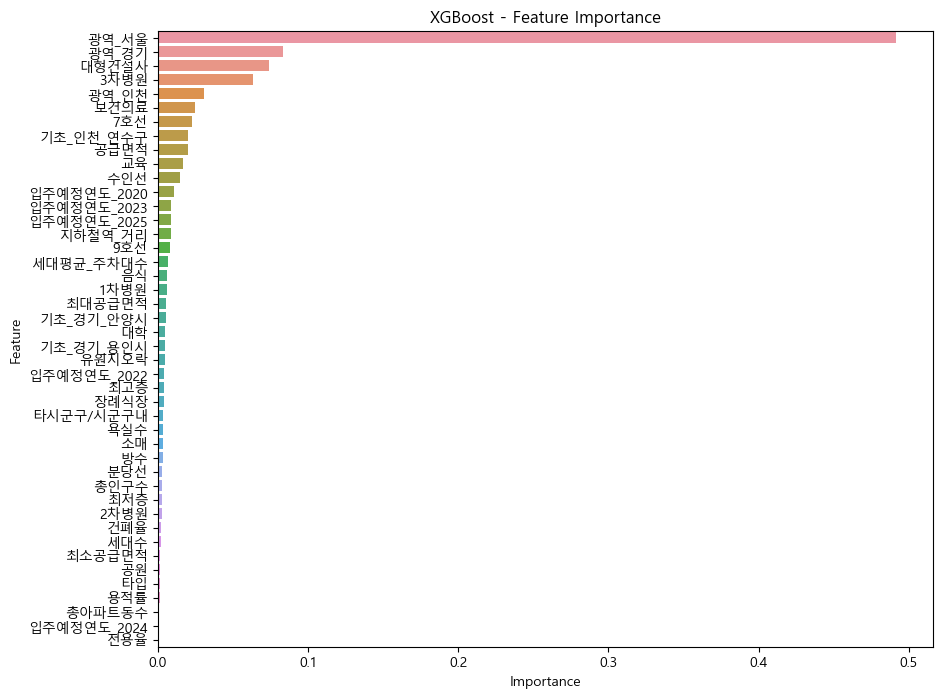

In [57]:
# 변수 중요도를 피처 이름과 함께 출력
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# 변수 중요도를 시각화
plt.figure(figsize=(10, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('XGBoost - Feature Importance')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

#### CatBoost 튜닝

In [ ]:
X = df_y_drop2[col_list]
y = target_df.iloc[:, 0]

In [25]:
# CatBoost
param_space = {
    'depth': hp.quniform('depth', 3, 16, 1),
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.3),
    'l2_leaf_reg': hp.quniform('l2_leaf_reg', 3, 9, 2),
    'colsample_bylevel': hp.uniform('colsample_bylevel',0.7, 1),
    'bagging_temperature': hp.uniform('bagging_temperature',0.25, 1.75)
}

# Objective 함수 정의 (하이퍼파라미터 튜닝의 목적 함수)
def objective_cat(params):
    model = CatBoostRegressor(
        n_estimators=250,
        depth=int(params['depth']),
        learning_rate=float(params['learning_rate']),
        l2_leaf_reg=int(params['l2_leaf_reg']),
        colsample_bylevel=float(params['colsample_bylevel']),
        bagging_temperature=float(params['bagging_temperature']),
        random_state=42, 
        verbose=0
    )
    
    avg_rmse = cross_validate_model(model, X, y)
    return avg_rmse

# Hyperopt를 통한 하이퍼파라미터 튜닝
trials = Trials()
best = fmin(fn=objective_cat, space=param_space, algo=tpe.suggest, max_evals=200, trials=trials)

print("Best hyperparameters:", best)

100%|██████████| 200/200 [2:49:10<00:00, 50.75s/trial, best loss: 7070.302334072684]   
Best hyperparameters: {'bagging_temperature': 0.38665831325881816, 'colsample_bylevel': 0.920919685955274, 'depth': 6.0, 'l2_leaf_reg': 4.0, 'learning_rate': 0.2439645409236956}


In [58]:
best = {'bagging_temperature': 0.3866, 'colsample_bylevel': 0.9210, 'depth': 6, 'l2_leaf_reg': 4, 'learning_rate': 0.2440}

In [59]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)



model = CatBoostRegressor(n_estimators=5000, random_state=42)
model.set_params(**best)

eval_set = [(X_test_scaled, y_test)]

model.fit(X_train_scaled, y_train, eval_set=eval_set, early_stopping_rounds=1000) 
y_pred = model.predict(X_test_scaled)


mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)  # RMSE 계산
mae = mean_absolute_error(y_test, y_pred)  # MAE 계산
r2 = r2_score(y_test, y_pred)

print(f"'CatBoost' - RMSE: {rmse:.2f}, MAE: {mae:.2f}, MSE: {mse:.2f}, R2: {r2:.4f}")

0:	learn: 30449.7353840	test: 26308.4976684	best: 26308.4976684 (0)	total: 2.67ms	remaining: 13.3s
1:	learn: 27180.6728855	test: 23852.8079462	best: 23852.8079462 (1)	total: 5ms	remaining: 12.5s
2:	learn: 24066.0724382	test: 21059.9989582	best: 21059.9989582 (2)	total: 7.68ms	remaining: 12.8s
3:	learn: 21781.0380230	test: 19371.0644139	best: 19371.0644139 (3)	total: 10.1ms	remaining: 12.7s
4:	learn: 19735.5355752	test: 18123.0831892	best: 18123.0831892 (4)	total: 13.4ms	remaining: 13.4s
5:	learn: 18314.8838398	test: 17154.6647623	best: 17154.6647623 (5)	total: 15.8ms	remaining: 13.2s
6:	learn: 17184.3843901	test: 16533.4601172	best: 16533.4601172 (6)	total: 18.8ms	remaining: 13.4s
7:	learn: 15975.3248508	test: 15368.6815837	best: 15368.6815837 (7)	total: 21.4ms	remaining: 13.3s
8:	learn: 15076.8949896	test: 14551.9954294	best: 14551.9954294 (8)	total: 23.9ms	remaining: 13.2s
9:	learn: 14341.1084150	test: 13889.9546936	best: 13889.9546936 (9)	total: 26ms	remaining: 13s
10:	learn: 13669.

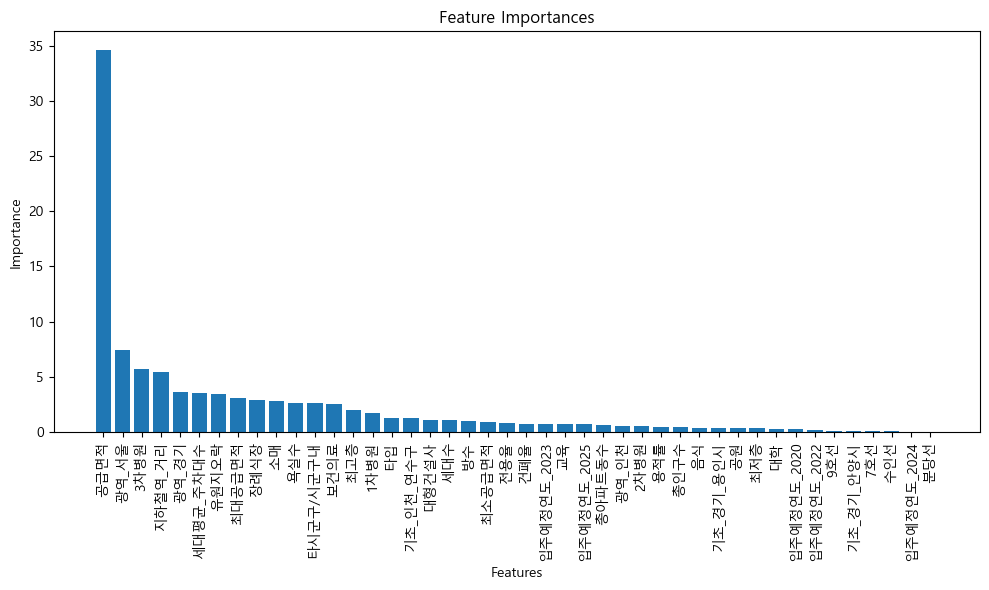

In [60]:
feature_importances = model.feature_importances_
feature_names = X.columns  # Assuming X is a pandas DataFrame with column names

# Sort the features and their importances in descending order
sorted_indices = np.argsort(feature_importances)[::-1]
sorted_importances = feature_importances[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

# Create a bar plot of feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_importances)), sorted_importances)
plt.xticks(range(len(sorted_importances)), sorted_feature_names, rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.tight_layout()
plt.show()

### 평당금액 
변수선택 다시해봐야함

In [26]:
X = df_y_drop2
y = target_df.iloc[:, 1]

result_list3 = {'cols': [],
               'RMSE': [],
                'MAE': [],
                'MSE': [],
                'R2': [],
                'train_RMSE': [],
                'train_MAE': [],
                'train_MSE': [],
                'train_R2': []}

col_list = list(X.keys())

for n in range(60, 0, -1):
    RFE_50_select = features_select(using_models[5:6], X[col_list], y, selector='RFE', data_results=True, num_selected_features=n)
    X = df_y_drop2[col_list]
    X = X.iloc[:, RFE_50_select['CatBoost']]
    y = target_df.iloc[:, 0]
    result1, result2 = tree_models_kfold(X, y, n_splits=10,  data_results=True)
    col_list = list(X.keys())
    
    result_list3['cols'].append(col_list)
    result_list3['train_RMSE'].append(np.mean(result2['train_RMSE']))
    result_list3['train_MAE'].append(np.mean(result2['train_MAE']))
    result_list3['train_MSE'].append(np.mean(result2['train_MSE']))
    result_list3['train_R2'].append(np.mean(result2['train_R2']))
    result_list3['RMSE'].append(np.mean(result2['RMSE']))
    result_list3['MAE'].append(np.mean(result2['MAE']))
    result_list3['MSE'].append(np.mean(result2['MSE']))
    result_list3['R2'].append(np.mean(result2['R2']))

Selected features for CatBoost: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  32  33  35  37  42  44
  46  47  50  53  55  56  57  58  59  61  62  63  67  69  75  80  86  94
  99 102 106 110 118 126]
CatBoost - RMSE: 4941.74, MAE: 2065.69, MSE: 24420762.52, R2: 0.9630
CatBoost - RMSE: 5211.40, MAE: 2767.54, MSE: 27158708.42, R2: 0.9728
CatBoost - RMSE: 4875.55, MAE: 2398.15, MSE: 23770975.53, R2: 0.9781
CatBoost - RMSE: 4366.72, MAE: 2431.18, MSE: 19068223.28, R2: 0.9761
CatBoost - RMSE: 9107.07, MAE: 3368.02, MSE: 82938713.77, R2: 0.9421
CatBoost - RMSE: 4193.34, MAE: 2393.30, MSE: 17584059.42, R2: 0.9821
CatBoost - RMSE: 11692.54, MAE: 3744.83, MSE: 136715531.22, R2: 0.9150
CatBoost - RMSE: 4081.62, MAE: 1940.44, MSE: 16659617.62, R2: 0.9738
CatBoost - RMSE: 4057.74, MAE: 2138.61, MSE: 16465274.24, R2: 0.9879
CatBoost - RMSE: 5231.70, MAE: 2818.81, MSE: 27370701.42, R2: 0.9824
Selected features for CatBoost:

In [27]:
X = df_y_drop2[result_list3['cols'][-50]]
y = target_df.iloc[:, 1]

In [28]:
# ExtraTreesRegressor
param_space = {
    'max_depth': hp.quniform('max_depth', 1, 32, 1),
    'min_samples_split': hp.quniform('min_samples_split', 2, 20, 1),
    'min_samples_leaf': hp.quniform('min_samples_leaf', 1, 20, 1)
}

# Objective 함수 정의 (하이퍼파라미터 튜닝의 목적 함수)
def objective_Ext(params):
    model = ExtraTreesRegressor(
        n_estimators=500,
        max_depth=int(params['max_depth']),
        min_samples_split=int(params['min_samples_split']),
        min_samples_leaf=int(params['min_samples_leaf']),
        random_state=42,
        n_jobs=-1
    )
    
    avg_rmse = cross_validate_model(model, X, y)
    return avg_rmse

# Hyperopt를 통한 하이퍼파라미터 튜닝
trials = Trials()
best = fmin(fn=objective_Ext, space=param_space, algo=tpe.suggest, max_evals=100, trials=trials)

print("Best hyperparameters:", best)

100%|██████████| 100/100 [06:20<00:00,  3.81s/trial, best loss: 141.94385394431836]
Best hyperparameters: {'max_depth': 22.0, 'min_samples_leaf': 1.0, 'min_samples_split': 3.0}


In [29]:
# LightGBM
param_space = {
    'max_depth': hp.quniform('max_depth', 1, 32, 1),
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.2),
    'subsample': hp.uniform('subsample', 0.7, 1.0),
    'min_child_weight': hp.quniform('min_child_weight', 1, 8, 1),
    'reg_alpha': hp.uniform('reg_alpha ',0, 0.3),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.6, 1.0),
    'reg_lambda': hp.uniform('reg_lambda', 0, 5)
}


# Objective 함수 정의 (하이퍼파라미터 튜닝의 목적 함수)
def objective_LGBM(params):
    model = lgb.LGBMRegressor(
        n_estimators=2500,
        max_depth=int(params['max_depth']),
        learning_rate=float(params['learning_rate']),
        subsample=float(params['subsample']),
        min_child_weight=float(params['min_child_weight']),
        reg_alpha=float(params['reg_alpha']),
        colsample_bytree=float(params['colsample_bytree']),
        reg_lambda=float(params['reg_lambda']),
        random_state=42,
        n_jobs=-1
    )
    
    avg_rmse = cross_validate_model(model, X, y)
    return avg_rmse

# Hyperopt를 통한 하이퍼파라미터 튜닝
trials = Trials()
best = fmin(fn=objective_LGBM, space=param_space, algo=tpe.suggest, max_evals=250, trials=trials)

print("Best hyperparameters:", best)

100%|██████████| 250/250 [45:57<00:00, 11.03s/trial, best loss: 139.45648082275002]
Best hyperparameters: {'colsample_bytree': 0.6019550061526627, 'learning_rate': 0.018623397415820413, 'max_depth': 25.0, 'min_child_weight': 5.0, 'reg_alpha ': 0.03981698060594199, 'reg_lambda': 0.25541108546223884, 'subsample': 0.7707426047357292}


In [30]:
# XGBoost
param_space = {
    'max_depth': hp.quniform('max_depth', 1, 32, 1),
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.2),
    'subsample': hp.uniform('subsample', 0.7, 1.0),
    'min_child_weight': hp.quniform('min_child_weight', 1, 8, 1),
    'reg_alpha': hp.uniform('reg_alpha',0, 0.3),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.6, 1.0),
    'gamma': hp.uniform('gamma', 0, 5)
}


# Objective 함수 정의 (하이퍼파라미터 튜닝의 목적 함수)
def objective_XGB(params):
    model = XGBRegressor(
        n_estimators=2500,
        max_depth=int(params['max_depth']),
        learning_rate=float(params['learning_rate']),
        subsample=float(params['subsample']),
        min_child_weight=float(params['min_child_weight']),
        reg_alpha=float(params['reg_alpha']),
        colsample_bytree=float(params['colsample_bytree']),
        gamma=float(params['gamma']),
        random_state=42,
        n_jobs=-1
    )
    
    avg_rmse = cross_validate_model(model, X, y)
    return avg_rmse

# Hyperopt를 통한 하이퍼파라미터 튜닝
trials = Trials()
best = fmin(fn=objective_XGB, space=param_space, algo=tpe.suggest, max_evals=250, trials=trials)

print("Best hyperparameters:", best)

100%|██████████| 250/250 [1:33:50<00:00, 22.52s/trial, best loss: 137.1824019973685]
Best hyperparameters: {'colsample_bytree': 0.6112339709418805, 'gamma': 1.0956714579790265, 'learning_rate': 0.03737410779232388, 'max_depth': 6.0, 'min_child_weight': 5.0, 'reg_alpha': 0.2729204236723784, 'subsample': 0.7850312475838119}


In [31]:
# CatBoost
param_space = {
    'depth': hp.quniform('depth', 3, 16, 1),
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.3),
    'l2_leaf_reg': hp.quniform('l2_leaf_reg', 3, 9, 2),
    'colsample_bylevel': hp.uniform('colsample_bylevel',0.7, 1),
    'bagging_temperature': hp.uniform('bagging_temperature',0.25, 1.75)
}

# Objective 함수 정의 (하이퍼파라미터 튜닝의 목적 함수)
def objective_cat(params):
    model = CatBoostRegressor(
        n_estimators=250,
        depth=int(params['depth']),
        learning_rate=float(params['learning_rate']),
        l2_leaf_reg=int(params['l2_leaf_reg']),
        colsample_bylevel=float(params['colsample_bylevel']),
        bagging_temperature=float(params['bagging_temperature']),
        random_state=42, 
        verbose=0
    )
    
    avg_rmse = cross_validate_model(model, X, y)
    return avg_rmse

# Hyperopt를 통한 하이퍼파라미터 튜닝
trials = Trials()
best = fmin(fn=objective_cat, space=param_space, algo=tpe.suggest, max_evals=200, trials=trials)

print("Best hyperparameters:", best)

100%|██████████| 200/200 [4:35:37<00:00, 82.69s/trial, best loss: 140.21759040751266]   
Best hyperparameters: {'bagging_temperature': 0.2959795063275649, 'colsample_bylevel': 0.7800692393556129, 'depth': 9.0, 'l2_leaf_reg': 6.0, 'learning_rate': 0.20987320706225238}


In [151]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)



model = CatBoostRegressor(n_estimators=2500, random_state=42)
model.set_params(**best)

eval_set = [(X_test_scaled, y_test)]

model.fit(X_train_scaled, y_train, eval_set=eval_set, early_stopping_rounds=200) # 디폴트 RMSE
y_pred = model.predict(X_test_scaled)


mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)  # RMSE 계산
mae = mean_absolute_error(y_test, y_pred)  # MAE 계산
r2 = r2_score(y_test, y_pred)

print(f"'CatBoost' - RMSE: {rmse:.2f}, MAE: {mae:.2f}, MSE: {mse:.2f}, R2: {r2:.4f}")

0:	learn: 730.6394891	test: 711.0682613	best: 711.0682613 (0)	total: 2.38ms	remaining: 5.95s
1:	learn: 650.3582811	test: 633.2956000	best: 633.2956000 (1)	total: 4.68ms	remaining: 5.84s
2:	learn: 585.3150299	test: 571.6814056	best: 571.6814056 (2)	total: 7.46ms	remaining: 6.21s
3:	learn: 536.9007163	test: 526.4951873	best: 526.4951873 (3)	total: 9.6ms	remaining: 5.99s
4:	learn: 493.3596844	test: 486.5434530	best: 486.5434530 (4)	total: 13.4ms	remaining: 6.7s
5:	learn: 460.8005181	test: 458.0313716	best: 458.0313716 (5)	total: 15.8ms	remaining: 6.57s
6:	learn: 433.2861811	test: 430.3301582	best: 430.3301582 (6)	total: 18.1ms	remaining: 6.43s
7:	learn: 410.4194976	test: 408.3112198	best: 408.3112198 (7)	total: 20ms	remaining: 6.23s
8:	learn: 390.4615201	test: 389.1858297	best: 389.1858297 (8)	total: 22.4ms	remaining: 6.21s
9:	learn: 377.9802156	test: 378.6815928	best: 378.6815928 (9)	total: 24.4ms	remaining: 6.08s
10:	learn: 362.4997209	test: 361.5974436	best: 361.5974436 (10)	total: 26.

Shrink model to first 804 iterations.
'CatBoost' - RMSE: 109.09, MAE: 65.79, MSE: 11899.72, R2: 0.9802

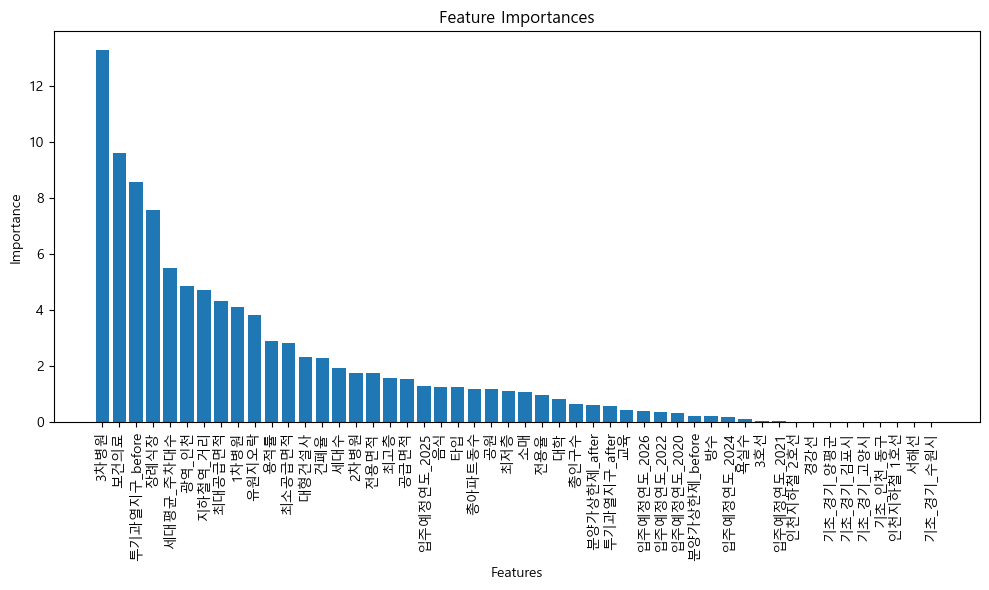

In [153]:
feature_importances = model.feature_importances_
feature_names = X.columns  # Assuming X is a pandas DataFrame with column names

# Sort the features and their importances in descending order
sorted_indices = np.argsort(feature_importances)[::-1]
sorted_importances = feature_importances[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

# Create a bar plot of feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_importances)), sorted_importances)
plt.xticks(range(len(sorted_importances)), sorted_feature_names, rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.tight_layout()
plt.show()

### 화성시만

평택(36) 수원(25) 파주(23) 용인(21)

In [101]:
best = {'bagging_temperature': 1.2025295613741107, 'colsample_bylevel': 0.9557388960101476, 'depth': 6, 'l2_leaf_reg': 4, 'learning_rate': 0.19958989362412313}

In [133]:
city_list = ['기초_경기_화성시','기초_경기_수원시','기초_경기_파주시','기초_경기_용인시']

In [141]:
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

for city in city_list:
    city_indices = df_y_drop2[df_y_drop2[city] == 1].index
    X = df_y_drop2.drop(['투기과열지구_after', '분양가상한제_after', '투기과열지구_before', '분양가상한제_before'], axis=1).iloc[city_indices, :61]
    y = target_df.iloc[city_indices, 0]

    rmse_scores, mae_scores, mse_scores, r2_scores = [], [], [], []

    for train_idx, test_idx in kfold.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        model = CatBoostRegressor(n_estimators=2500, random_state=42, verbose=0)
        model.set_params(**best)
        eval_set = [(X_test_scaled, y_test)]
        model.fit(X_train_scaled, y_train, eval_set=eval_set, early_stopping_rounds=500)
        y_pred = model.predict(X_test_scaled)

        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        rmse_scores.append(rmse)
        mae_scores.append(mae)
        mse_scores.append(mse)
        r2_scores.append(r2)

    avg_rmse = np.mean(rmse_scores)
    avg_mae = np.mean(mae_scores)
    avg_mse = np.mean(mse_scores)
    avg_r2 = np.mean(r2_scores)

    print(f"'CatBoost' {city} - Average RMSE: {avg_rmse:.2f}, Average MAE: {avg_mae:.2f}, Average MSE: {avg_mse:.2f}, Average R2: {avg_r2:.4f}")

'CatBoost' 기초_경기_화성시 - Average RMSE: 4497.52, Average MAE: 2270.13, Average MSE: 22034763.09, Average R2: 0.9396
'CatBoost' 기초_경기_수원시 - Average RMSE: 3364.54, Average MAE: 2105.94, Average MSE: 12494571.32, Average R2: 0.9685
'CatBoost' 기초_경기_파주시 - Average RMSE: 3358.93, Average MAE: 2420.20, Average MSE: 11765609.34, Average R2: 0.9537
'CatBoost' 기초_경기_용인시 - Average RMSE: 4429.52, Average MAE: 2861.70, Average MSE: 21513455.54, Average R2: 0.9656


In [154]:
kfold = KFold(n_splits=5, shuffle=True, random_state=42)

for city in city_list:
    city_indices = df_y_drop2[df_y_drop2[city] == 1].index
    X = df_y_drop2.drop(['투기과열지구_after', '분양가상한제_after', '투기과열지구_before', '분양가상한제_before'], axis=1).iloc[city_indices, :61]
    y = target_df.iloc[city_indices, 1]

    rmse_scores, mae_scores, mse_scores, r2_scores = [], [], [], []

    for train_idx, test_idx in kfold.split(X):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        model = CatBoostRegressor(n_estimators=2500, random_state=42, verbose=0)
        model.set_params(**best)
        eval_set = [(X_test_scaled, y_test)]
        model.fit(X_train_scaled, y_train, eval_set=eval_set, early_stopping_rounds=500)
        y_pred = model.predict(X_test_scaled)

        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        rmse_scores.append(rmse)
        mae_scores.append(mae)
        mse_scores.append(mse)
        r2_scores.append(r2)

    avg_rmse = np.mean(rmse_scores)
    avg_mae = np.mean(mae_scores)
    avg_mse = np.mean(mse_scores)
    avg_r2 = np.mean(r2_scores)

    print(f"'CatBoost' {city} - Average RMSE: {avg_rmse:.2f}, Average MAE: {avg_mae:.2f}, Average MSE: {avg_mse:.2f}, Average R2: {avg_r2:.4f}")

'CatBoost' 기초_경기_화성시 - Average RMSE: 72.55, Average MAE: 40.81, Average MSE: 5450.25, Average R2: 0.9353
'CatBoost' 기초_경기_수원시 - Average RMSE: 57.09, Average MAE: 39.66, Average MSE: 3380.39, Average R2: 0.9079
'CatBoost' 기초_경기_파주시 - Average RMSE: 79.47, Average MAE: 56.53, Average MSE: 6688.94, Average R2: 0.8637
'CatBoost' 기초_경기_용인시 - Average RMSE: 123.01, Average MAE: 74.39, Average MSE: 17384.14, Average R2: 0.9537


In [140]:
for city in city_list:
    test_df = df_y_drop2[df_y_drop2[city] == 1]
    test_df.drop(['투기과열지구_after', '분양가상한제_after', '투기과열지구_before', '분양가상한제_before'], axis=1, inplace=True)
    test_df = test_df[test_df.keys()[:61]]

    X = test_df
    y = target_df.iloc[test_df.index,0]


    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

    scaler = StandardScaler()

    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)



    model = CatBoostRegressor(n_estimators=2500, random_state=42, verbose=0)
    model.set_params(**best)

    eval_set = [(X_test_scaled, y_test)]

    model.fit(X_train_scaled, y_train, eval_set=eval_set, early_stopping_rounds=500) 
    y_pred = model.predict(X_test_scaled)


    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)  # RMSE 계산
    mae = mean_absolute_error(y_test, y_pred)  # MAE 계산
    r2 = r2_score(y_test, y_pred)

    print(f"'CatBoost' {city} - RMSE: {rmse:.2f}, MAE: {mae:.2f}, MSE: {mse:.2f}, R2: {r2:.4f}")

'CatBoost' 기초_경기_화성시 - RMSE: 5622.42, MAE: 2675.99, MSE: 31611572.27, R2: 0.8762
'CatBoost' 기초_경기_수원시 - RMSE: 5290.30, MAE: 3123.28, MSE: 27987261.83, R2: 0.9458
'CatBoost' 기초_경기_파주시 - RMSE: 3827.02, MAE: 2720.47, MSE: 14646116.10, R2: 0.9552
'CatBoost' 기초_경기_용인시 - RMSE: 5593.71, MAE: 3550.65, MSE: 31289595.43, R2: 0.9491


In [131]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)



model = CatBoostRegressor(n_estimators=2500, random_state=42, verbose=0)
model.set_params(**best)

eval_set = [(X_test_scaled, y_test)]

model.fit(X_train_scaled, y_train, eval_set=eval_set, early_stopping_rounds=200) 
y_pred = model.predict(X_test_scaled)


mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)  # RMSE 계산
mae = mean_absolute_error(y_test, y_pred)  # MAE 계산
r2 = r2_score(y_test, y_pred)

print(f"'CatBoost' - RMSE: {rmse:.2f}, MAE: {mae:.2f}, MSE: {mse:.2f}, R2: {r2:.4f}")

'CatBoost' - RMSE: 68.34, MAE: 35.49, MSE: 4670.97, R2: 0.9443


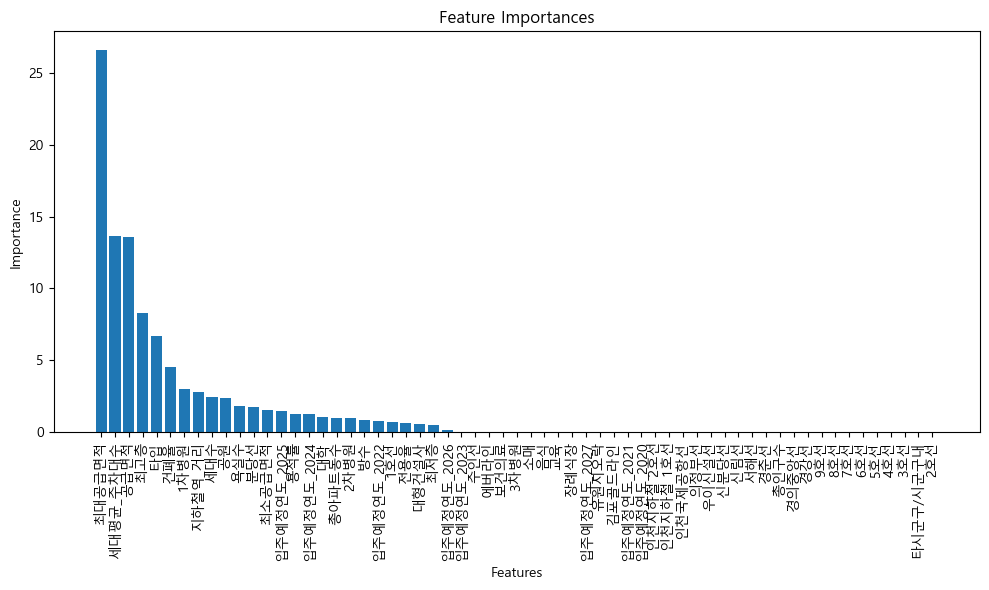

In [130]:
feature_importances = model.feature_importances_
feature_names = X.columns  # Assuming X is a pandas DataFrame with column names

# Sort the features and their importances in descending order
sorted_indices = np.argsort(feature_importances)[::-1]
sorted_importances = feature_importances[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

# Create a bar plot of feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_importances)), sorted_importances)
plt.xticks(range(len(sorted_importances)), sorted_feature_names, rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.tight_layout()
plt.show()